<center><h1>TableNet: Deep Learning model for end-to-end Table Detection and Tabular data extraction from Scanned Data Images</h1></center>

In modern times, more and more number of people are sharing their documents as photos taken from smartphones. A lot of these documents contain lots of information in one or more tables. These tables often contain very important information and extracting this information from the image is a task of utmost importance.<br>
In modern times, information extraction from these tables is done manually, which requires a lot of effort and time and hence is very inefficient. Therefore, having an end-to-end system that given only the document image, can recognize and localize the tabular region and also recognizing the table structure (columns) and then extract the textual information from the tabular region automatically will be of great help since it will make our work easier and much faster.<br>
[TableNet](https://arxiv.org/abs/2001.01469) is just that. It is an end-to-end deep learning model that can localize the tabular region in a document image, understand the table structure and extract text data from it given only the document image.
<br>
Earlier state-of-the-art deep learning methods took the two problems, that is, _table detection_ and _table structure recognition_ (recognizing rows and columns in the table) as separate and treated them separately. However, given the interdependence of the two tasks, TableNet considers them as two related sub-problems and solves them using a single neural network. Thus, also making it relatively lightweight and less compute intensive solution.

## Business Problem:
The problem is aimed at extracting textual information from tables present in a document image. To be more clear, the aim here is to design a model that can, given only an image as the input, localize the tabular region(s) in the image if any is present, segment out and understand the structure (columns) of the table and finally filter the table and the columns and then extract textual information from the filtered out region.<br>
Thus, this is a image segmentation task where we have to:
- Segment out the tabular regions from an image of the document.
- In that tabular region, find out the table structure, that is, segment out the various columns of the table.

Then using the predicted segmentation masks, we will filter the table out of the image and then extract the textual information from the table using OCR.

## Performance Metrics:
The performance metrics that we will use here would be the <br>
__F1 Score__.: During actual use of the model, we want that the model's predictions are as accurate as possible. We want that the model:
- predicts/segments the correct regions in the image (TP) while,
- predicts maximum area of the image that does not contain any tabular region to be non-tabular regions(TN)
- and does not leave any tabular region "non-predicted" (FN)
- and finally, does not predict any non-tabular region to be a tabular region (FP).

As a result, using F1 score would be a good choice, since, having a high F1 score would mean all the above criteria are specified, that is, the model correctly segments maximum area in the tabular regions while also minizmies the wrong segmentation of any non tabular regions.

## About the Dataset:
The dataset that is being used for training the model is known as the __Marmot Dataset__. The marmot dataset is a table detection dataset that contains 1016 document images containing one or more tables. Out of those 1016 documents, 509 are in english and are used for training and testing purposes in this case study.<br>
The dataset contains 509 unique images and for each image, an xml file that contains the coordinates of the actual masks of the tables.<br>
Initially, the Marmot dataset only contained the masks for tables as it is only a table detection dataset. However, it was manually annotated for the structural information (column masks) by the authors of the TableNet research paper. This modified version of the Marmot dataset will be used throughout this case study as the dataset of choice.

## References:
- TableNet: https://arxiv.org/abs/2001.01469
- TableNet: Deep Learning Model for End-to-end Table Detection and Tabular Data Extraction From Scanned Document Images: https://medium.com/analytics-vidhya/tablenet-deep-learning-model-for-end-to-end-table-detection-and-tabular-data-extraction-from-1961fb2f97e1

## Loading the required Libraries

In [ ]:
# installing pytesseract for OCR
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 40 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 0s (31.4 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Personal\ Case\ Study\ 2

/content/drive/MyDrive/Personal Case Study 2


In [ ]:
!pwd

/content/drive/MyDrive/Personal Case Study 2


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import os
from tqdm import tqdm
import cv2
from PIL import Image
from sklearn.model_selection import train_test_split
from PIL import Image
import pytesseract

In [ ]:
# https://medium.com/@JeansPantRushi/fix-for-tensorflow-v2-failed-to-get-convolution-algorithm-b367a088b56e
physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

## Organizing the dataset in folders
As of now, all the images and their xml files are present inside the same folder, first we are going to make two folders in the dataset folder for images and xml files separately.

In [ ]:
# listing all the files present in the dataset folder
all_items = os.listdir('Marmot_data/')
print(len(all_items))
print(*all_items[:5], sep='\n')

1004
10.1.1.1.2006_3.bmp
10.1.1.1.2006_3.xml
10.1.1.1.2010_5.bmp
10.1.1.1.2013_63.bmp
10.1.1.1.2013_63.xml


In [ ]:
# making the image and the xml folders
os.mkdir('Marmot_data\\Images')
os.mkdir('Marmot_data\\xmls')

In [ ]:
# making two new folders
image_dir = 'Marmot_data\\Images'
xml_dir = 'Marmot_data\\xmls'

bmps = []
xmls = []
# looping over all the files and moving them to the correct folder
for item in tqdm(all_items):
    if item.endswith('.bmp'): # if its an image
        fname = 'Marmot_data\\'+item
        os.rename(fname, os.path.join(image_dir, item))
        bmps.append(image_dir+'\\'+item)
    elif item.endswith('.xml'): # if its an xml file
        fname = 'Marmot_data\\'+item
        os.rename(fname, os.path.join(xml_dir, item))
        xmls.append(xml_dir+'\\'+item)
    else:
        continue # if another file found

100%|████████████████████████████████████████████████████████████████████████████| 1004/1004 [00:00<00:00, 7490.95it/s]


In [ ]:
len(bmps), len(xmls)

(509, 495)

Looking at the above cell, we can see that for some of the images do not have xml files. Lets print the file names of the images that do not contain the respective xml files.

In [ ]:
# all the filenames for xml files
xml_fnames = ['.'.join(fn.split('\\')[-1].split('.')[:-1]) for fn in xmls]
# list of filenames in the images folder that are not present in the xml folder
not_present = [fn for fn in bmps if '.'.join(fn.split('\\')[-1].split('.')[:-1]) not in xml_fnames]
print(len(not_present))
print(*not_present, sep='\n')

15
Marmot_data\Images\10.1.1.1.2010_5.bmp
Marmot_data\Images\10.1.1.1.2076_73.bmp
Marmot_data\Images\10.1.1.1.2107_9.bmp
Marmot_data\Images\10.1.1.100.2006_12.bmp
Marmot_data\Images\10.1.1.100.293_25.bmp
Marmot_data\Images\10.1.1.100.293_47.bmp
Marmot_data\Images\10.1.1.120.1540_16.bmp
Marmot_data\Images\10.1.1.120.1540_21.bmp
Marmot_data\Images\10.1.1.160.585_35.bmp
Marmot_data\Images\10.1.1.160.585_36.bmp
Marmot_data\Images\10.1.1.160.669_3.bmp
Marmot_data\Images\10.1.1.160.677_2.bmp
Marmot_data\Images\10.1.1.6.2367_13.bmp
Marmot_data\Images\10.1.1.7.2174_3.bmp
Marmot_data\Images\10.1.1.7.2174_8.bmp


There are 15 such images for which we do not have any xml file present in the dataset. <br>
Now, lets check if we have any xml files that do not have any corresponding images.

In [ ]:
# all the filenames for xml files
bmp_fnames = ['.'.join(fn.split('\\')[-1].split('.')[:-1]) for fn in bmps]
# list of filenames in the images folder that are not present in the xml folder
not_present = [fn for fn in xmls if '.'.join(fn.split('\\')[-1].split('.')[:-1]) not in bmp_fnames]
print(len(not_present))
print(*not_present, sep='\n')

1
Marmot_data\xmls\10.1.1.1.xml


There is only one xml file for which we do not have any image in the dataset.<br>
Now, lets make a dataframe that contains paths for all the images and their xml files.

In [ ]:
valid_bmps = []
for i in range(len(bmps)):
    fname = bmp_fnames[i]
    if fname in xml_fnames:
        valid_bmps.append(bmps[i]) # getting all the bmps with available xml files

# this xml file does not have a corresponding image
xmls.remove('Marmot_data\\xmls\\10.1.1.1.xml')

In [ ]:
# making a dataframe containing the file paths of all the images and their corresponding xml file paths
data_paths = pd.DataFrame({'Image':valid_bmps, 'xml':xmls})
print(data_paths.shape)
data_paths.head()

(494, 2)


,Image,xml
0,Marmot_data\Images\10.1.1.1.2006_3.bmp,Marmot_data\xmls\10.1.1.1.2006_3.xml
1,Marmot_data\Images\10.1.1.1.2013_63.bmp,Marmot_data\xmls\10.1.1.1.2013_63.xml
2,Marmot_data\Images\10.1.1.1.2013_64.bmp,Marmot_data\xmls\10.1.1.1.2013_64.xml
3,Marmot_data\Images\10.1.1.1.2014_4.bmp,Marmot_data\xmls\10.1.1.1.2014_4.xml
4,Marmot_data\Images\10.1.1.1.2014_6.bmp,Marmot_data\xmls\10.1.1.1.2014_6.xml


In [ ]:
# saving this dataframe to disk
data_paths.to_csv('Marmot_data\\dataset.csv', index=False)

## Randomly loading a few images:
Now, lets randomly load some images and print them to get an idea of what kind of tables are we dealing with.<br>
We will randomly select 7 images from the dataset.

Image Path: Marmot_data\Images\10.1.1.36.218_12.bmp


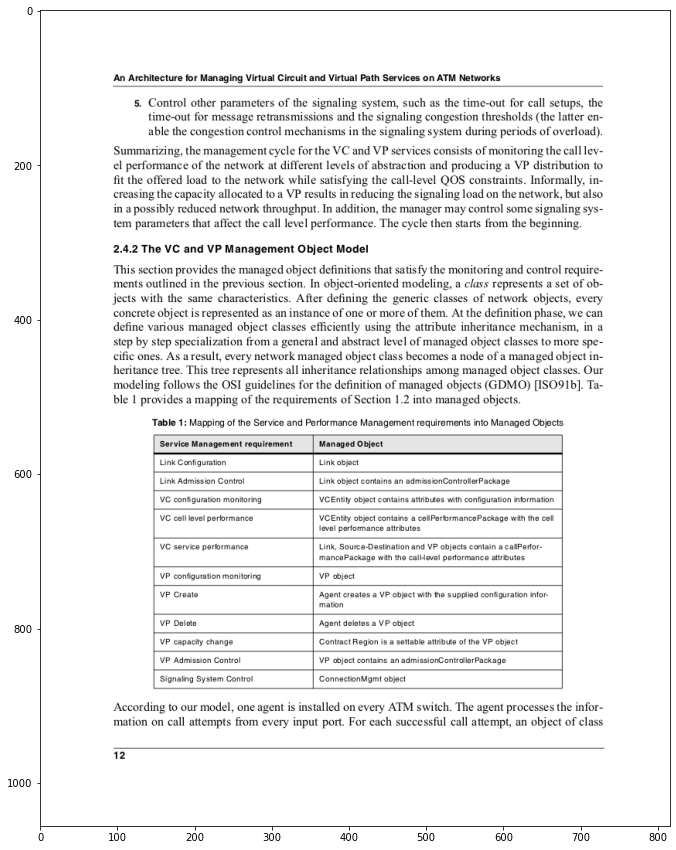

----------------------------------------------------------------------------------------------------
Image Path: Marmot_data\Images\10.1.1.8.2123_5.bmp


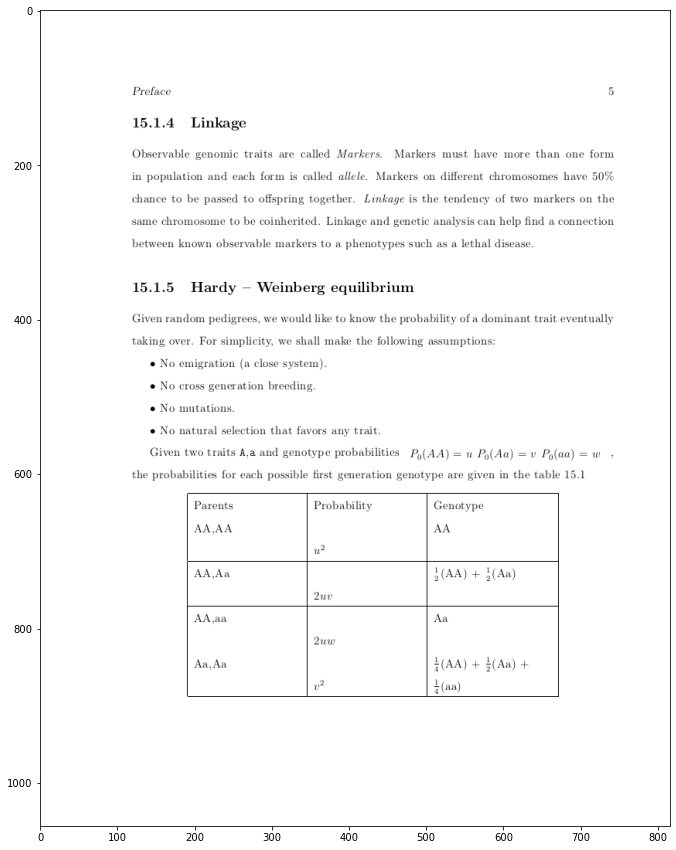

----------------------------------------------------------------------------------------------------
Image Path: Marmot_data\Images\10.1.1.160.563_8.bmp


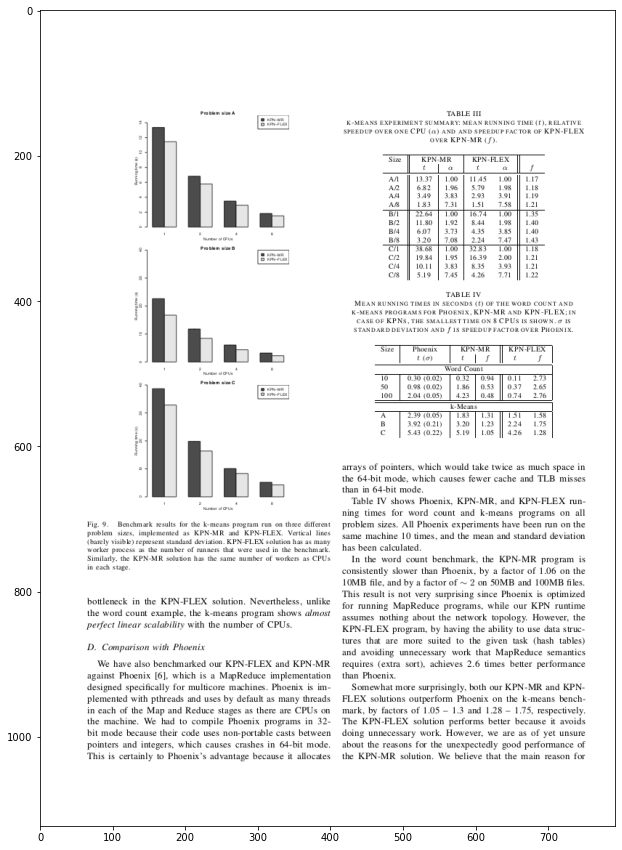

----------------------------------------------------------------------------------------------------
Image Path: Marmot_data\Images\10.1.1.6.2372_3.bmp


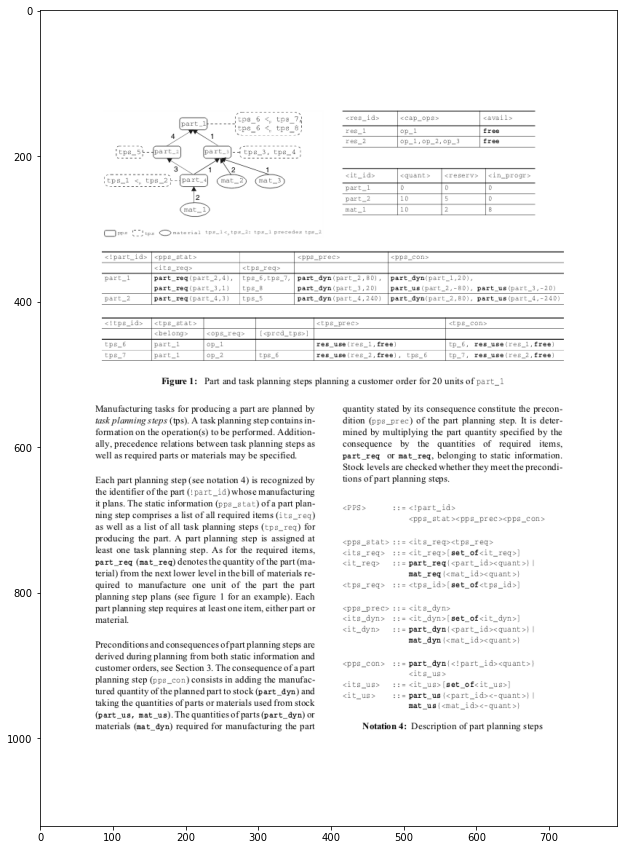

----------------------------------------------------------------------------------------------------
Image Path: Marmot_data\Images\10.1.1.6.2264_70.bmp


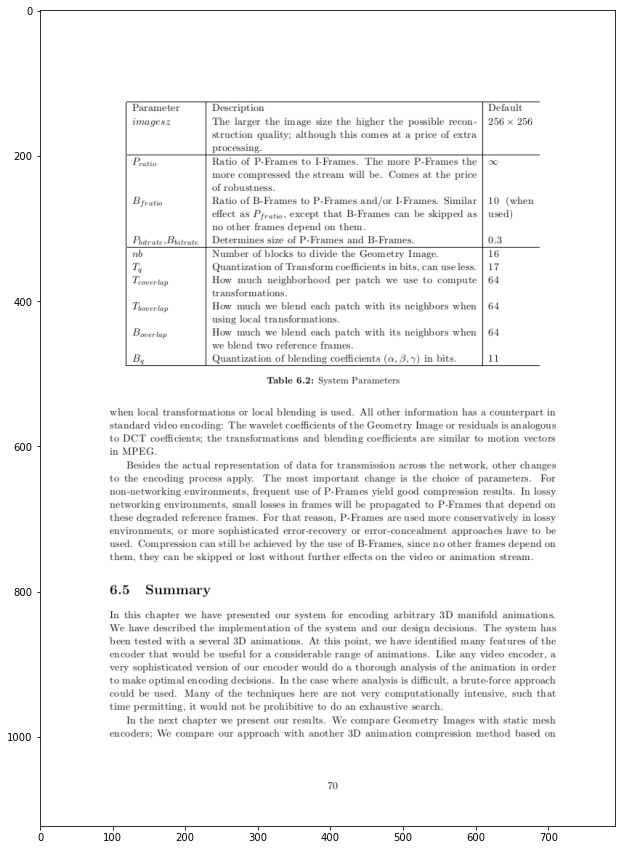

----------------------------------------------------------------------------------------------------
Image Path: Marmot_data\Images\10.1.1.12.9006_6.bmp


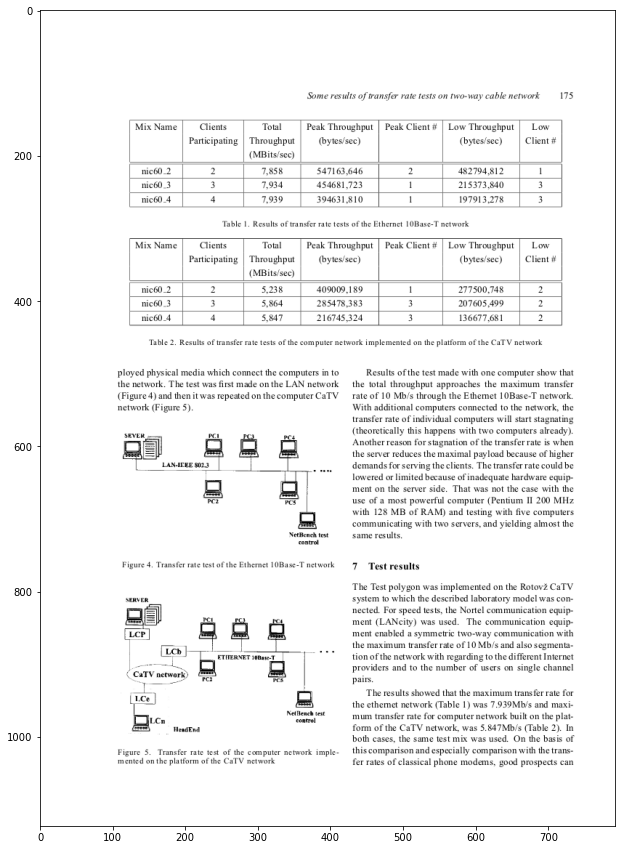

----------------------------------------------------------------------------------------------------
Image Path: Marmot_data\Images\10.1.1.37.5365_7.bmp


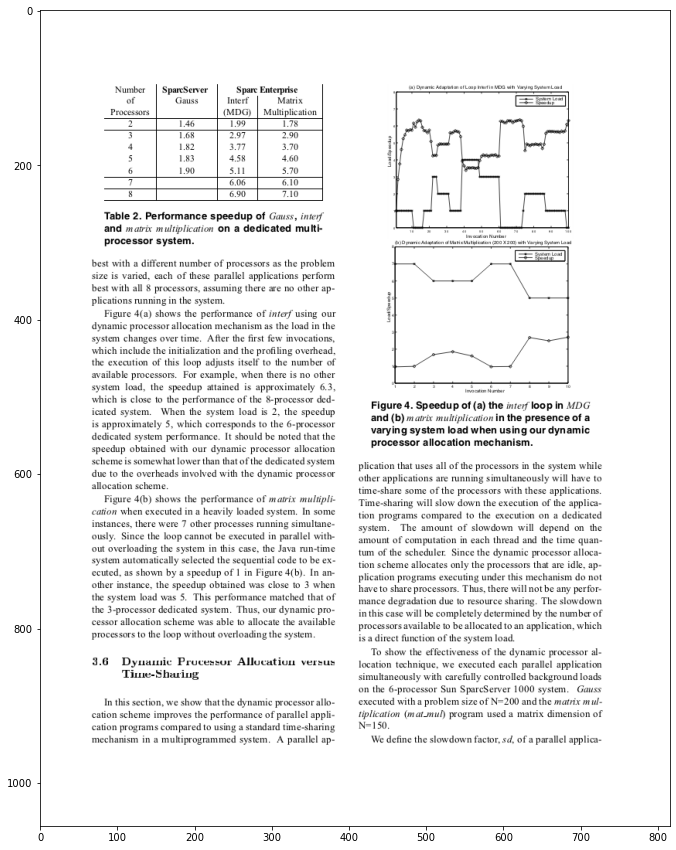

----------------------------------------------------------------------------------------------------


In [ ]:
for i in range(7):
    ind = np.random.randint(0, 493)
    impath = data_paths['Image'][ind]
    print("Image Path:", impath)
    # read the image
    im = cv2.imread(impath, cv2.IMREAD_UNCHANGED)[:,:,:3]
    fig, ax = plt.subplots(figsize=(15,15))
    plt.imshow(im)
    plt.show()
    print('-'*100)

### Observations from the images:
- From the images, we can see that the tables are present all over the image. They do not have a specified position. They are present in very different locations in different images.
- They also do not have fixed size. The tables in some images are very small while some images have tables that are considerably large. Some images might even have only a table present.
- Coming to the table structures, the tables in all the images are very different. Some have a well defined boundary between columns, rows and the table is also enclosed by a boundary. While some only have separations between the colums, or rows etc.
- Now, looking at the number of tables in an image, we can see that there is quite a lot of diversity here as well, there are some images with only one table, while some have two, some have three and there is an image in the above 7 that has as much as 4 different tables.
- Some images also have graphs and figures. This is a good thing because then the model will hvae to learn the actual details/features of the tables and can not just get away with only identifying a table based on just a bounding box of a certain size with some grids present in them. This will make it work better in real world scenarios.

Thus, we can see from only these 7 images that we have a large variety of tables in the dataset in terms of size, positioning and even styling. This is a good thing since our model will be exposed to a variety of tables and hence learn to generalize much better.<br>
___
## Looking at the xml file:
Now, let us take a look at the xml file and see its contents:

In [ ]:
with open(data_paths['xml'][0]) as xml:
    cont = xml.read()
print(cont)

<annotation verified="yes">
	<folder>MARMOT_ANNOTATION</folder>
	<filename>10.1.1.1.2006_3.bmp</filename>
	<path>/home/monika/Desktop/MARMOT_ANNOTATION/10.1.1.1.2006_3.bmp</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>793</width>
		<height>1123</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>column</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>458</xmin>
			<ymin>710</ymin>
			<xmax>517</xmax>
			<ymax>785</ymax>
		</bndbox>
	</object>
	<object>
		<name>column</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>531</xmin>
			<ymin>710</ymin>
			<xmax>568</xmax>
			<ymax>783</ymax>
		</bndbox>
	</object>
	<object>
		<name>column</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>583</xmin>
			<ymin>712</ymin>
			<xmax>619</xmax>
			<ymax>785</ymax>
		</

Looking at the annotation xml file, we can get the following observations:
- Only columns have been annotated for all the images and not tables explicitly. The table masks have to be derieved from the masks of the columns in the image.
- The first few lines of the xml provide metatdata about the image such as the folder name, filename, path of the image etc.
- Then, the size tag tells us about the dimensionality (height, width and depth) of the image.
- The object tags contain the actual coordinates of the masks for each column present in the table.
- In the object tag, the bndbox contains the xmin, xmax, ymin and ymax coordinates for the column mask rectangle. USing these 4 points, the position of the entire mask can be found out since it is a rectangle in all cases.
- Coordinates are written under different object tags for different columns.
- Using these column bounding box coordinates only, we will have to get the coordinates of the bounding boxes of the tables in the image.

In [ ]:
# loading data_paths
data_paths = pd.read_csv('Marmot_data\\dataset.csv')
print(data_paths.shape)
data_paths.head()

(494, 2)


,Image,xml
0,Marmot_data\Images\10.1.1.1.2006_3.bmp,Marmot_data\xmls\10.1.1.1.2006_3.xml
1,Marmot_data\Images\10.1.1.1.2013_63.bmp,Marmot_data\xmls\10.1.1.1.2013_63.xml
2,Marmot_data\Images\10.1.1.1.2013_64.bmp,Marmot_data\xmls\10.1.1.1.2013_64.xml
3,Marmot_data\Images\10.1.1.1.2014_4.bmp,Marmot_data\xmls\10.1.1.1.2014_4.xml
4,Marmot_data\Images\10.1.1.1.2014_6.bmp,Marmot_data\xmls\10.1.1.1.2014_6.xml


### Making the Table and Column mask images and saving them to the disk
We are given only the column masks in the xml files for each image. Thus, we will have to infer the coordinates for the table mask using the column masks themselves.<br>
For making the masks, we will be making a matrix of similar dimensions to that of the image and wherever there is a column/table present, the pixel values would be 255 and every other pixel value is going to be 0.<br>
Making the column masks is going to be pretty straightforward since we are given the coordinates (xmin, xmax, ymin and ymax) for each column. The real challenge here would be the construction of table masks and thus, finding the right table coordinates given all the column masks.<br>
___
For this, we are going to follow the following rules:
- If there are only two columns in the entire xml file, then its only logical that they will belong to the same table.
- Two columns will belong to the same table if they are close to each other and will belong to different tables if they are far apart.
- Once all the columns that are close are found, the table coordinates would be: xmin, ymin from the left-most column and xmax, ymax from the right-most column for the table.

In [ ]:
def calculate_distance(point1, point2):
    '''
        This function calculates euclidean distance between two coordinates.
        Make sure that the inputs are numpy arrays and not lists
    '''
    # refer: https://numpy.org/doc/stable/reference/generated/numpy.linalg.norm.html
    dist = np.linalg.norm(point1-point2)
    return dist

def save_image(image, path):
    '''
        This function makes and image from the given image matrix and saves it in the given path.
    '''
    im = Image.fromarray(image)
    im.save(path)

In [ ]:
# making directories for the column and image masks
col_mask_paths = [] # list for storing the paths of the column masks
table_mask_paths = [] # list for storing the table masks paths
os.mkdir('Marmot_data\\Table_masks')
os.mkdir('Marmot_data\\Column_masks')

In [ ]:
# looping over all the images, creating the table and column masks and saving to disk
# REFER: https://medium.com/analytics-vidhya/tablenet-deep-learning-model-for-end-to-end-table-detection-and-tabular-data-extraction-from-1961fb2f97e1
for ind, xpath in enumerate(tqdm(data_paths['xml'])):
    # parsing the xml file
    tree = ET.parse(xpath)
    # getting the root and other nodes
    root = tree.getroot()
    # getting the metadata about the mask image
    size = root.find('size')
    width = int(size.find('width').text)
    height = int(size.find('height').text)
    depth = int(size.find('depth').text)
    # getting the filename
    fname = '.'.join(root.find('filename').text.split('.')[:-1])
    # making arrays for column and table mask images
    col_mask = np.zeros(shape=(height, width), dtype=np.uint8)
    table_mask = np.zeros(shape=(height, width), dtype=np.uint8)
    
    # declaring some variables
    newTable = True # flag specifying the start of a new table
    fwdFlag = False # flag specifying if the current column is to the right of the previous column
    bwdFlag = False # flag specifying if the current column is to the left of the previous column
    table_xmin = 0 # xmin for the table
    table_xmax = 0 # xmax for the table
    table_ymin = 0 # ymin for the table
    table_ymax = 0 # ymax for the table
    dist = 0 # for storing the distance between two points
    prev_dist = 0
    
    
    # making the masks
    # getting all the column objects
    objects = root.findall('object')
    for index, obj in enumerate(objects):
        # getting the bounding box
        bndbox = obj.find('bndbox')
        # getting the coordinates for the column
        xmin = int(bndbox.find('xmin').text)
        xmax = int(bndbox.find('xmax').text)
        ymin = int(bndbox.find('ymin').text)
        ymax = int(bndbox.find('ymax').text)
        # making the column mask
        col_mask[ymin:ymax, xmin:xmax] = 255
        
        # making the table mask
        if len(objects) <=2:
            # if there are only two columns in the entire image, they will belong to the same table itself
            # getting all the coordinates of the columns
            xmins = [int(obj.find('bndbox/xmin').text) for obj in objects]
            xmaxes = [int(obj.find('bndbox/xmax').text) for obj in objects]
            ymins = [int(obj.find('bndbox/ymin').text) for obj in objects]
            ymaxes = [int(obj.find('bndbox/ymax').text) for obj in objects]
            # making the mask
            table_xmin = min(xmins)
            table_xmax = max(xmaxes)
            table_ymin = min(ymins)
            table_ymax = min(ymaxes)
            table_mask[table_ymin:table_ymax, table_xmin:table_xmax] = 255
            continue
            
        if index==0: # if this is the first column of the entire xml file
            prev_xmin = int(obj.find('bndbox/xmin').text)
            prev_xmax = int(obj.find('bndbox/xmax').text)
            prev_ymin = int(obj.find('bndbox/ymin').text)
            prev_ymax = int(obj.find('bndbox/ymax').text)
        else: # if its not the first column
            if xmin>prev_xmin and newTable: # if its and new table and the current column is next to the previous one
                table_xmin = prev_xmin
                table_ymin = prev_ymin
                newTable = False
                fwdFlag = True
                bwdFlag = False
            if xmin<prev_xmin and newTable: # if its a new table and the current column is before the previous one
                table_xmax = prev_xmax
                table_ymax = prev_ymax
                newTable = False
                fwdFlag = False
                bwdFlag = True
                
            # creating table masks based on different conditions:
            if fwdFlag:
                # calculating the distance between the bottom right corner of the prev col and the bottom left corner of the
                # current col
                dist = calculate_distance(np.array([xmin, ymin]), np.array([prev_xmax, prev_ymin]))
                
                if prev_dist==0: # if the previous distance is not defined in any situation, i.e., its the second column of the entire
                    # xml file or the new column
                    prev_dist = dist
                else:
                    if dist//prev_dist > 3: # distance between particular points of two columns is very large, then they must belong to
                        # different tables
                        newTable = True
                        table_mask[table_ymin:prev_ymax, table_xmin:prev_xmax] = 255
                        prev_dist = 0
                        
                    if index==len(objects)-1: # if this is the last column for the entire xml file
                        newTable = True
                        table_mask[table_ymin:ymax, table_xmin:xmax] = 255
                        prev_dist = 0
                        
            if bwdFlag:
                dist = calculate_distance(np.array([xmax, ymin]), np.array([prev_xmin, prev_ymin]))
                
                if prev_dist==0:
                    prev_dist = dist
                else:
                    if dist//prev_dist>3 or index==len(objects)-1:
                        newTable = True
                        table_mask[prev_ymin:table_ymax, xmin:table_xmax] = 255
                        prev_dist = 0
            
            # updating the values of the prev_coordinates and distance
            prev_xmin = int(obj.find('bndbox/xmin').text)
            prev_xmax = int(obj.find('bndbox/xmax').text)
            prev_ymin = int(obj.find('bndbox/ymin').text)
            prev_ymax = int(obj.find('bndbox/ymax').text)
            prev_dist = dist
            
    # saving the column and the table masks
    # filepath
    col_path = 'Marmot_data\\Column_masks\\'+fname+'.jpeg'
    table_path = 'Marmot_data\\Table_masks\\'+fname+'.jpeg'
    col_mask_paths.append(col_path)
    table_mask_paths.append(table_path)
    # saving the table and the image masks
    save_image(col_mask, col_path)
    save_image(table_mask, table_path)

100%|███████████████████████████████████████████████████████████████████████████████| 494/494 [00:04<00:00, 104.86it/s]


In [ ]:
# updating the dataframe and saving it too
data_paths['Column_mask'] = col_mask_paths
data_paths['Table_mask'] = table_mask_paths
print(data_paths.shape)
data_paths.head()

(494, 4)


,Image,xml,Column_mask,Table_mask
0,Marmot_data\Images\10.1.1.1.2006_3.bmp,Marmot_data\xmls\10.1.1.1.2006_3.xml,Marmot_data\Column_masks\10.1.1.1.2006_3.jpeg,Marmot_data\Table_masks\10.1.1.1.2006_3.jpeg
1,Marmot_data\Images\10.1.1.1.2013_63.bmp,Marmot_data\xmls\10.1.1.1.2013_63.xml,Marmot_data\Column_masks\10.1.1.1.2013_63.jpeg,Marmot_data\Table_masks\10.1.1.1.2013_63.jpeg
2,Marmot_data\Images\10.1.1.1.2013_64.bmp,Marmot_data\xmls\10.1.1.1.2013_64.xml,Marmot_data\Column_masks\10.1.1.1.2013_64.jpeg,Marmot_data\Table_masks\10.1.1.1.2013_64.jpeg
3,Marmot_data\Images\10.1.1.1.2014_4.bmp,Marmot_data\xmls\10.1.1.1.2014_4.xml,Marmot_data\Column_masks\10.1.1.1.2014_4.jpeg,Marmot_data\Table_masks\10.1.1.1.2014_4.jpeg
4,Marmot_data\Images\10.1.1.1.2014_6.bmp,Marmot_data\xmls\10.1.1.1.2014_6.xml,Marmot_data\Column_masks\10.1.1.1.2014_6.jpeg,Marmot_data\Table_masks\10.1.1.1.2014_6.jpeg


In [ ]:
# saving the file
data_paths.to_csv('Marmot_data\\dataset_final.csv', index=False)

In [ ]:
# loading the csv file
data_paths = pd.read_csv('Marmot_data/dataset_final.csv')
print(data_paths.shape)
data_paths.head()

(494, 4)


,Image,xml,Column_mask,Table_mask
0,Marmot_data\Images\10.1.1.1.2006_3.bmp,Marmot_data\xmls\10.1.1.1.2006_3.xml,Marmot_data\Column_masks\10.1.1.1.2006_3.jpeg,Marmot_data\Table_masks\10.1.1.1.2006_3.jpeg
1,Marmot_data\Images\10.1.1.1.2013_63.bmp,Marmot_data\xmls\10.1.1.1.2013_63.xml,Marmot_data\Column_masks\10.1.1.1.2013_63.jpeg,Marmot_data\Table_masks\10.1.1.1.2013_63.jpeg
2,Marmot_data\Images\10.1.1.1.2013_64.bmp,Marmot_data\xmls\10.1.1.1.2013_64.xml,Marmot_data\Column_masks\10.1.1.1.2013_64.jpeg,Marmot_data\Table_masks\10.1.1.1.2013_64.jpeg
3,Marmot_data\Images\10.1.1.1.2014_4.bmp,Marmot_data\xmls\10.1.1.1.2014_4.xml,Marmot_data\Column_masks\10.1.1.1.2014_4.jpeg,Marmot_data\Table_masks\10.1.1.1.2014_4.jpeg
4,Marmot_data\Images\10.1.1.1.2014_6.bmp,Marmot_data\xmls\10.1.1.1.2014_6.xml,Marmot_data\Column_masks\10.1.1.1.2014_6.jpeg,Marmot_data\Table_masks\10.1.1.1.2014_6.jpeg


All the above steps were performed in a windows operating system and hence, the paths that are present in the dataframe are windows paths with \ as separator. However, colab uses / as separator. As a result, we will need to change the separator.

In [ ]:
impaths = data_paths['Image'].apply(lambda p: p.replace('\\', os.sep))
tmpaths = data_paths['Table_mask'].apply(lambda p: p.replace('\\', os.sep))
cmpaths = data_paths['Column_mask'].apply(lambda p: p.replace('\\', os.sep))
xmlpaths = data_paths['xml'].apply(lambda p: p.replace('\\', os.sep))

In [ ]:
data_paths_corr = pd.DataFrame({'Image':impaths, 'xml':xmlpaths, 'Column_mask':cmpaths, 'Table_mask':tmpaths})
print(data_paths_corr.shape)
data_paths_corr.head(3)

(494, 4)


,Image,xml,Column_mask,Table_mask
0,Marmot_data/Images/10.1.1.1.2006_3.bmp,Marmot_data/xmls/10.1.1.1.2006_3.xml,Marmot_data/Column_masks/10.1.1.1.2006_3.jpeg,Marmot_data/Table_masks/10.1.1.1.2006_3.jpeg
1,Marmot_data/Images/10.1.1.1.2013_63.bmp,Marmot_data/xmls/10.1.1.1.2013_63.xml,Marmot_data/Column_masks/10.1.1.1.2013_63.jpeg,Marmot_data/Table_masks/10.1.1.1.2013_63.jpeg
2,Marmot_data/Images/10.1.1.1.2013_64.bmp,Marmot_data/xmls/10.1.1.1.2013_64.xml,Marmot_data/Column_masks/10.1.1.1.2013_64.jpeg,Marmot_data/Table_masks/10.1.1.1.2013_64.jpeg


In [ ]:
# saving the dataframe
data_paths_corr.to_csv('Marmot_data/dataset_final_colab.csv', index=False)
# load this for colab_

In [ ]:
# loading the corrected datafame
data_paths_corr = pd.read_csv('Marmot_data/dataset_final_colab.csv')
print(data_paths_corr.shape)
data_paths_corr.head()

(494, 4)


,Image,xml,Column_mask,Table_mask
0,Marmot_data/Images/10.1.1.1.2006_3.bmp,Marmot_data/xmls/10.1.1.1.2006_3.xml,Marmot_data/Column_masks/10.1.1.1.2006_3.jpeg,Marmot_data/Table_masks/10.1.1.1.2006_3.jpeg
1,Marmot_data/Images/10.1.1.1.2013_63.bmp,Marmot_data/xmls/10.1.1.1.2013_63.xml,Marmot_data/Column_masks/10.1.1.1.2013_63.jpeg,Marmot_data/Table_masks/10.1.1.1.2013_63.jpeg
2,Marmot_data/Images/10.1.1.1.2013_64.bmp,Marmot_data/xmls/10.1.1.1.2013_64.xml,Marmot_data/Column_masks/10.1.1.1.2013_64.jpeg,Marmot_data/Table_masks/10.1.1.1.2013_64.jpeg
3,Marmot_data/Images/10.1.1.1.2014_4.bmp,Marmot_data/xmls/10.1.1.1.2014_4.xml,Marmot_data/Column_masks/10.1.1.1.2014_4.jpeg,Marmot_data/Table_masks/10.1.1.1.2014_4.jpeg
4,Marmot_data/Images/10.1.1.1.2014_6.bmp,Marmot_data/xmls/10.1.1.1.2014_6.xml,Marmot_data/Column_masks/10.1.1.1.2014_6.jpeg,Marmot_data/Table_masks/10.1.1.1.2014_6.jpeg


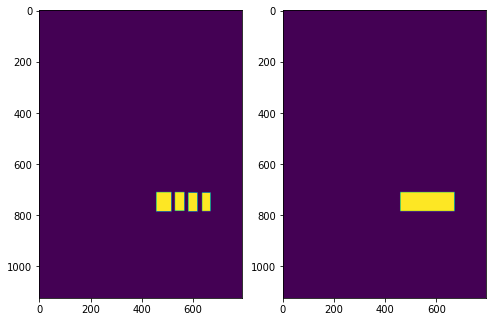

----------------------------------------------------------------------------------------------------


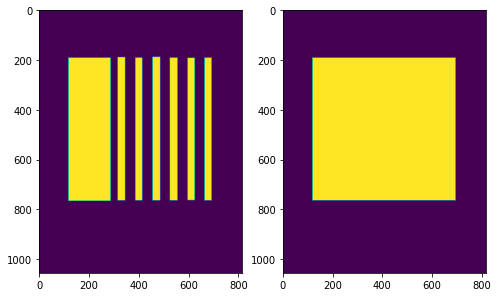

----------------------------------------------------------------------------------------------------


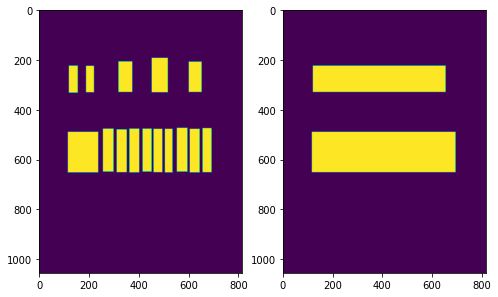

----------------------------------------------------------------------------------------------------


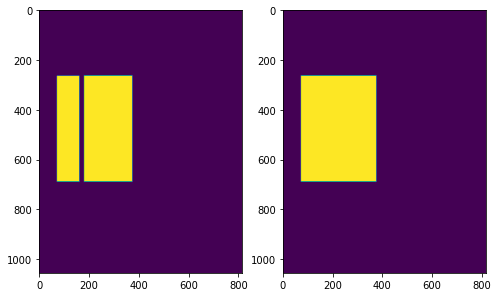

----------------------------------------------------------------------------------------------------


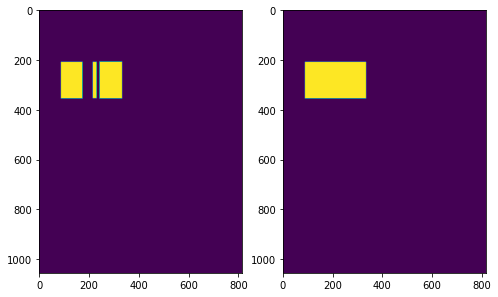

----------------------------------------------------------------------------------------------------


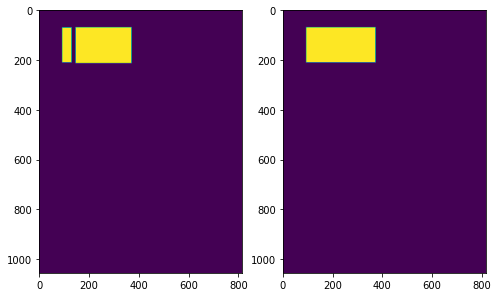

----------------------------------------------------------------------------------------------------


In [ ]:
# let us now print the masks for a few images
# printing masks for first 5 images
for ind, row in data_paths_corr.iterrows():
    cmpath = row['Column_mask']
    tmpath = row['Table_mask']
    # loading the mask images
    col_mask = cv2.imread(cmpath, cv2.IMREAD_UNCHANGED)
    table_mask = cv2.imread(tmpath, cv2.IMREAD_UNCHANGED)
    fig, ax = plt.subplots(ncols=2, figsize=(8,8))
    ax[0].imshow(col_mask)
    ax[1].imshow(table_mask)
    plt.show()
    print('-'*100)
    if ind==5:
        break

### Performing Train-test split of the dataset
We are going to split the dataset into training and test data. We are going to use a 80-20 % split ratio. 80% of the dataset will be for training and 20% will be for testing purposes.

In [ ]:
data_train, data_test = train_test_split(data_paths_corr, test_size=0.2, random_state=0)
print(data_train.shape, data_test.shape)
data_train.head()

(395, 4) (99, 4)


,Image,xml,Column_mask,Table_mask
414,Marmot_data/Images/10.1.1.6.2327_7.bmp,Marmot_data/xmls/10.1.1.6.2327_7.xml,Marmot_data/Column_masks/10.1.1.6.2327_7.jpeg,Marmot_data/Table_masks/10.1.1.6.2327_7.jpeg
213,Marmot_data/Images/10.1.1.160.684_3.bmp,Marmot_data/xmls/10.1.1.160.684_3.xml,Marmot_data/Column_masks/10.1.1.160.684_3.jpeg,Marmot_data/Table_masks/10.1.1.160.684_3.jpeg
71,Marmot_data/Images/10.1.1.1.2134_223.bmp,Marmot_data/xmls/10.1.1.1.2134_223.xml,Marmot_data/Column_masks/10.1.1.1.2134_223.jpeg,Marmot_data/Table_masks/10.1.1.1.2134_223.jpeg
322,Marmot_data/Images/10.1.1.32.4629_8.bmp,Marmot_data/xmls/10.1.1.32.4629_8.xml,Marmot_data/Column_masks/10.1.1.32.4629_8.jpeg,Marmot_data/Table_masks/10.1.1.32.4629_8.jpeg
6,Marmot_data/Images/10.1.1.1.2018_8.bmp,Marmot_data/xmls/10.1.1.1.2018_8.xml,Marmot_data/Column_masks/10.1.1.1.2018_8.jpeg,Marmot_data/Table_masks/10.1.1.1.2018_8.jpeg


### Making a custom dataset for training
Since we are dealing with images of considerable size, it is not possible to store all of them in memory during training and testing. Therefore, we will make a custom datagenerator that generates batches of training and validation data on the fly during training.<br>
The custom dataloader will take the dataframe containing paths to the original image, the column and table masks and load the images from those paths. It will also perform some image preprocessing such as resizing the image, performing some data augmentation etc.

In [ ]:
# we will use tf.data.Dataset for making the custom data generators
# the data generator will return tuple of (image, table_mask, column_mask)
# https://www.tensorflow.org/api_docs/python/tf/data/Dataset#from_tensor_slices
# https://www.tensorflow.org/tutorials/load_data/images#using_tfdata_for_finer_control
training_dataset = tf.data.Dataset.from_tensor_slices((tf.cast(data_train['Image'].values, tf.string),
                                                       tf.cast(data_train['Table_mask'].values, tf.string),
                                                       tf.cast(data_train['Column_mask'].values, tf.string)
                                                      ))

testing_dataset = tf.data.Dataset.from_tensor_slices((tf.cast(data_test['Image'].values, tf.string),
                                                      tf.cast(data_test['Table_mask'].values, tf.string),
                                                      tf.cast(data_test['Column_mask'].values, tf.string)
                                                      ))

In [ ]:
# listing a few datapoints from the data generator
# for training
for tup in training_dataset.take(3):
    print(tup)
    
print('-'*100)

# for testing
for tup in testing_dataset.take(3):
    print(tup)

(<tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Images/10.1.1.6.2327_7.bmp'>, <tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Table_masks/10.1.1.6.2327_7.jpeg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Column_masks/10.1.1.6.2327_7.jpeg'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Images/10.1.1.160.684_3.bmp'>, <tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Table_masks/10.1.1.160.684_3.jpeg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Column_masks/10.1.1.160.684_3.jpeg'>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Images/10.1.1.1.2134_223.bmp'>, <tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Table_masks/10.1.1.1.2134_223.jpeg'>, <tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Column_masks/10.1.1.1.2134_223.jpeg'>)
----------------------------------------------------------------------------------------------------
(<tf.Tensor: shape=(), dtype=string, numpy=b'Marmot_data/Images/10.1.1.34.

Now that the custom data generator objects are created, it will return the filepaths for the image, column and table masks. Now, we need to create a function that can take these paths, load the respective images, preprocess them and return a tuple of the image matrices.

In [ ]:
@tf.function
def process_path(ipath, tmpath, cmpath):
    '''
        This function takes the paths of the image, table and column masks from the tf.data.Dataset and loads them,
        preprocessess them, applies a image augmentation and returns the actual image matrices.
    '''
    # reading the images
    im = tf.io.read_file(ipath)
    table_mask = tf.io.read_file(tmpath)
    col_mask = tf.io.read_file(cmpath)
    
    # decoding the images
    im = tf.io.decode_bmp(im, channels=4)[:,:,:3] # the function decodes the image to have 4 channels for some reason and the last channel has zeros mostly
    im = tf.image.resize(im, size=[1024,1024]) # resizing the image to 1024x1024 as per the instructions of the paper.
    # making the pixel values for image between 0 and 1
    im = tf.cast(im, dtype=tf.float32)/255
    
    # decoding the masks 
    table_mask = tf.io.decode_jpeg(table_mask, channels=1)
    table_mask = tf.image.resize(table_mask, size=[1024,1024])
    table_mask = table_mask/255
    
    col_mask = tf.io.decode_jpeg(col_mask, channels=1)
    col_mask = tf.image.resize(col_mask, size=[1024,1024])
    col_mask = col_mask/255
    
    return im, {'table_decoder':table_mask, 'col_decoder':col_mask}

In [ ]:
# creating the final dataset objects
train = training_dataset.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = testing_dataset.map(process_path, num_parallel_calls=tf.data.experimental.AUTOTUNE)

Shapes:
Image: (1024, 1024, 3)
Table Mask: (1024, 1024, 1)
Column Mask: (1024, 1024, 1)


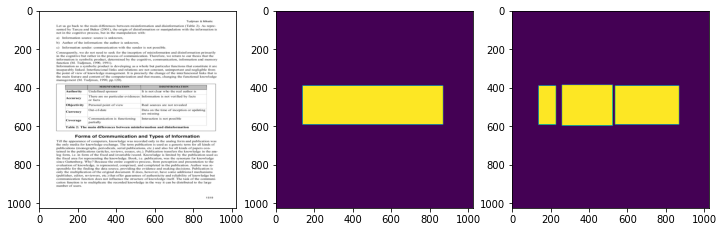

Shapes:
Image: (1024, 1024, 3)
Table Mask: (1024, 1024, 1)
Column Mask: (1024, 1024, 1)


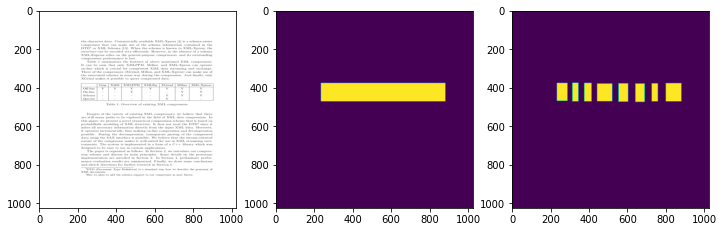

Shapes:
Image: (1024, 1024, 3)
Table Mask: (1024, 1024, 1)
Column Mask: (1024, 1024, 1)


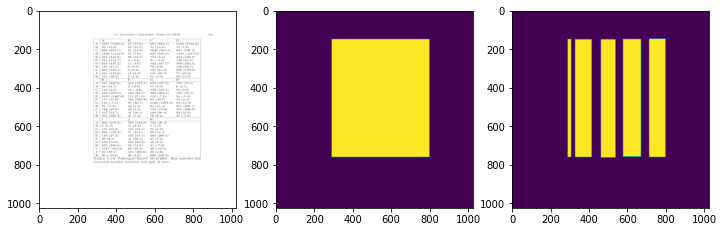

In [ ]:
# displaying an image
for image, mask_dict in train.take(3):
    print("Shapes:")
    print("Image:", image.shape)
    print('Table Mask:', mask_dict['table_decoder'].shape)
    print('Column Mask:', mask_dict['col_decoder'].shape)
    fig, ax = plt.subplots(ncols=3, figsize=(12,12))
    ax[0].imshow(image)
    ax[1].imshow(mask_dict['table_decoder'][:,:,0])
    ax[2].imshow(mask_dict['col_decoder'][:,:,0])
    plt.show()

In [ ]:
# optimizing the datasets for training
BUFFER_SIZE = 10 # using 10 elements from the dataset for shuffling at a time
batch_size = 1 # change it to 2 
def config_for_performance(ds):
    '''
        Function that configures a tf.data.Dataset object for performance during training.
    '''
    ds = ds.cache()
    ds = ds.shuffle(buffer_size=BUFFER_SIZE)
    ds = ds.batch(batch_size)
    ds = ds.repeat()
    ds = ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    
    return ds


train_dataset = config_for_performance(train)
test_dataset = config_for_performance(test)

### Making the model architecture
The model architecture is in the form of an encoder-decoder with the encoder being the pretrained VGG-19 model. As for the decoders, there are going to be two decoders, one for the image and column masks each. Both the decoders will be constructed from scratch and will be completely trained. As for training the encoder, we will only fine tune the VGG 19 model to fit our dataset better.

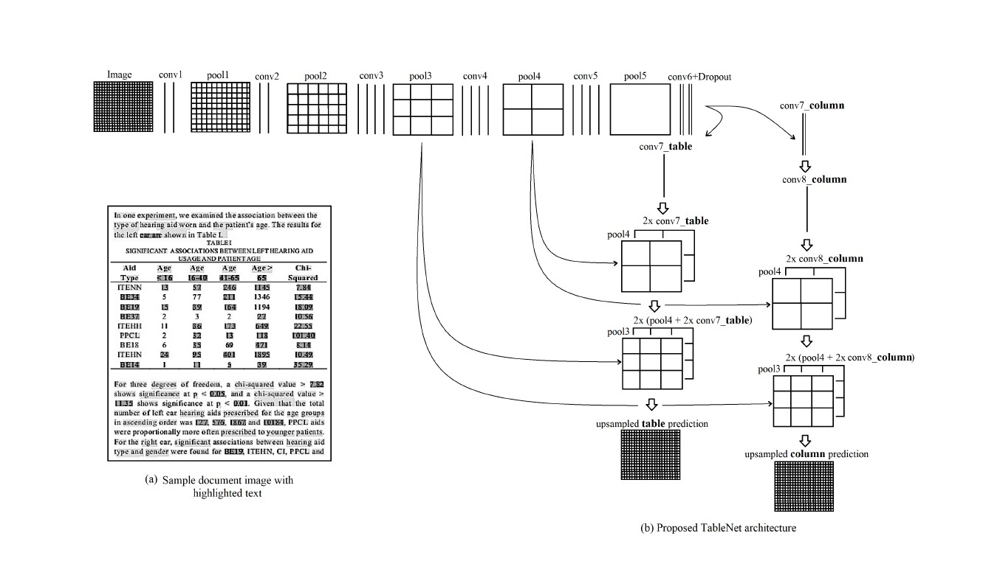

In [ ]:
# displaying the model architecture
from IPython.display import Image
Image('TableNet Architectur.jpg')

In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Concatenate, Add, Activation, UpSampling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping
from tensorflow.keras.applications import VGG19
from tensorflow.keras import regularizers

First lets make the architectures for both the decoder models. For both the models, we are going to define them as custom tensorflow layers and use them in the network.<br>
__Decoder Architectures:__<br>
1. _Table Decoder:_<br>
>- tensor = 1x1 Convolution(encoder_output)
>- tensor = Upscaling(tensor, 2x) + pool4
>- tensor = Upscaling(tensor, 2x) + pool3
>- tensor = Upscaling(tensor, to match input dimensions i.e. 1024x1024) -> This will be the final output of the table decoder.
2. _Column Decoder:_ <br>
>- tensor = 1x1 Convolution with ReLU activation(encoder_output)
>- tensor = Dropout(0.8, tensor)
>- tensor = 1x1 Convolution(tensor)
>- tensor = Upscaling(tensor, 2x) + pool4
>- tensor = Upscaling(tenor, 2x) + pool3
>- tensor = Upscaling(tensor, to match input dimensions, i.e., 1024x1024) -> This will be the final output of the column deocder

#### Table Decoder:

In [ ]:
class table_decoder(tf.keras.layers.Layer):
    '''
        This is the custom layer defined for the table decoder following the above architecture.
    '''
    def __init__(self):
        super().__init__()
        # defining the layers
        self.conv7 = Conv2D(filters=128, kernel_size=(1,1), kernel_regularizer=regularizers.l2(0.001))
        self.upsamp_pool4 = UpSampling2D(size=(2,2), interpolation='bilinear')
        self.upsamp_pool3 = UpSampling2D(size=(2,2), interpolation='bilinear')
        self.upsamp_out = Conv2DTranspose(filters=2, kernel_size=(3,3), strides=2, padding='same', activation='softmax')
        
    def call(self, inp, pool3, pool4):
        # passing through convolution
        x = self.conv7(inp)
        # upsampling and concatenating with pool4
        x = self.upsamp_pool4(x)
        x = Concatenate()([x, pool4])
        
        # upsampling and concatenating with pool3
        x = self.upsamp_pool3(x)
        x = Concatenate()([x, pool3])
        
        # further upsampling and output
        x = UpSampling2D((2,2))(x)
        x = UpSampling2D((2,2))(x)
        fin = self.upsamp_out(x)
        
        return fin

#### Column Decoder

In [ ]:
class col_decoder(tf.keras.layers.Layer):
    '''
        This custom layer is defined for the Column deocder following the above column decoder architecture. 
    '''
    def __init__(self):
        super().__init__()
        # defining the layers
        self.conv7 = Conv2D(filters=128, kernel_size=(1,1), kernel_regularizer=regularizers.l2(0.001), activation='relu')
        self.drop = Dropout(rate=0.8)
        self.conv8 = Conv2D(filters=128, kernel_size=(1,1), kernel_regularizer=regularizers.l2(0.001))
        self.upsamp_pool4 = UpSampling2D((2,2), interpolation='bilinear')
        self.upsamp_pool3 = UpSampling2D((2,2), interpolation='bilinear')
        self.upsamp_out = Conv2DTranspose(filters=2, kernel_size=(3,3), strides=2, padding='same', activation='softmax')
        
    def call(self, inp, pool3, pool4):
        # passing through convolutions
        x = self.conv7(inp)
        x = self.drop(x)
        x = self.conv8(x)
        
        # upsampling and concatenating encoder pool outputs
        x = self.upsamp_pool4(x)
        x = Concatenate()([x, pool4])
        x = self.upsamp_pool3(x)
        x = Concatenate()([x, pool3])
        
        # final upsampling and outputs
        x = UpSampling2D((2,2))(x)
        x = UpSampling2D((2,2))(x)
        fin = self.upsamp_out(x)
        
        return fin

Now, lets make the model and train it.

In [ ]:
tf.keras.backend.clear_session()
# encoder
model_input = Input(shape=(1024,1024,3))
encoder = VGG19(include_top=False, weights='imagenet', input_tensor=model_input)

# making the encoder weights non-trainable
for layer in encoder.layers:
    layer.trainable = False
    
# getting the intermediate pool4 and pool3 outputs
pool3 = encoder.get_layer('block3_pool').output
pool4 = encoder.get_layer('block4_pool').output
# print(pool3.shape, pool4.shape)

# continuing the model architecture
# convolution layers
conv_6 = Conv2D(filters=128, kernel_size=(1,1), activation='relu', name='block6_conv1',
                kernel_regularizer=regularizers.l2(0.001))(encoder.output)
conv6_drop = Dropout(0.2)(conv_6) # this is the dropping probability and in the paper the keep_prop seems to be 0.8.

conv_7 = Conv2D(filters=128, kernel_size=(1,1), activation='relu', name='block6_conv2',
                kernel_regularizer=regularizers.l2(0.001))(conv6_drop)
conv7_drop = Dropout(0.2)(conv_7) # this is the dropping probability and in the paper the keep_prop seems to be 0.8.

80142336/80134624 [==============================] - 1s 0us/step


In [ ]:
# decoder
table_mask = table_decoder()
column_mask = col_decoder()

table_out = table_mask(conv7_drop, pool3, pool4)
column_out = column_mask(conv7_drop, pool3, pool4)

# declaring the model
tablenet = Model(inputs=model_input, outputs=[table_out, column_out])
tablenet.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1024, 1024,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 1024, 1024, 6 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 1024, 1024, 6 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 512, 512, 64) 0           block1_conv2[0][0]               
______________________________________________________________________________________________

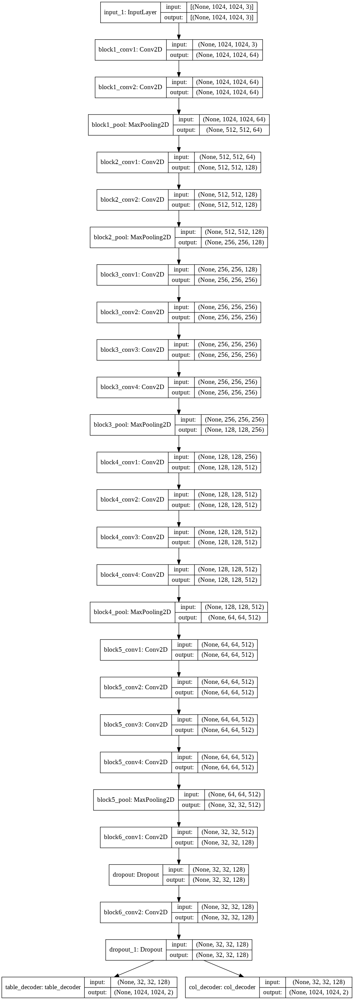

In [ ]:
# plotting the model
plot_model(tablenet, show_shapes=True)

In [ ]:
# defining metrics and losses for the model
losses = {'table_decoder':'sparse_categorical_crossentropy', 'col_decoder':'sparse_categorical_crossentropy'}

# making custom f1 score function since it is not available in tensorflow
# refer: https://www.tensorflow.org/guide/keras/train_and_evaluate#custom_metrics
# refer: https://stackoverflow.com/questions/64474463/custom-f1-score-metric-in-tensorflow
class F1Score(tf.keras.metrics.Metric):
    '''
        This is the custom class implementing the f1 score metric.
    '''
    def __init__(self, name='F1Score', **kwargs):
        super().__init__(name=name, **kwargs)
        self.f1 = self.add_weight(name='f1', initializer='zeros')
        # precision and recall objects for calculating f1 score
        self.precision = tf.keras.metrics.Precision(thresholds=0.5)
        self.recall = tf.keras.metrics.Recall(thresholds=0.5)
        
    def update_state(self, y_true, y_pred, sample_weight=None):
        # calculating the precision and recall scores
        pr = self.precision(y_true[:,:,:,0], tf.argmax(y_pred, axis=-1))
        re = self.recall(y_true[:,:,:,0], tf.argmax(y_pred, axis=-1))
        # assigning the value of f1 score to the f1 score variable
        self.f1.assign(2*(pr*re) / (pr+re+1e-5)) # adding a very small value to the denominator for DivideByZero Error
        
    def result(self):
        return self.f1
    
    def reset_state(self):
        self.f1.assign(0)
        self.precision.reset_states()
        self.recall.reset_states()

In [ ]:
# compiling the model
from tensorflow.keras.optimizers import Adam
lr = 0.0001 # as defined in the table
tablenet.compile(optimizer=Adam(learning_rate=lr, epsilon=1e-8), loss=losses, metrics=[F1Score()])

In [ ]:
# callbacks
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard, ModelCheckpoint

# tensorboard logs
logs = 'BaseModelLogs'
tb = TensorBoard(log_dir=logs, write_graph=True, write_grads=True)

# earlystopping
es = EarlyStopping(monitor='val_loss', mode='min', patience=5, verbose=1)

# modelcheckpoint
filepath = 'BaseModelCheckpoints/BaseModel-epoch{epoch:02d}.h5'
mc = ModelCheckpoint(filepath=filepath, save_weights_only=True, mode='min', verbose=1, save_best_only=True)

callbacks = [tb, es, mc]

In [ ]:
# saving the model
tablenet.save_weights('BaseTableNet.h5')

In [ ]:
# loading the weights
tablenet.load_weights('BaseTableNet.h5')

In [ ]:
# retraining the model for 20 more epochs
# this is the original tablenet architecture
train_steps = len(data_train) // batch_size
VALIDATION_STEPS=len(data_test)//batch_size//30
tablenet.fit(train_dataset,
            epochs=20,
            steps_per_epoch=train_steps,
            validation_data=test_dataset,
            validation_steps=VALIDATION_STEPS)

Epoch 1/20
197/197 [==============================] - 671s 3s/step - loss: 1.9711 - table_decoder_loss: 0.8171 - col_decoder_loss: 0.5415 - table_decoder_F1Score: 0.3830 - col_decoder_F1Score: 0.3130 - val_loss: 0.7912 - val_table_decoder_loss: 0.1500 - val_col_decoder_loss: 0.1235 - val_table_decoder_F1Score: 0.6825 - val_col_decoder_F1Score: 0.5693
Epoch 2/20
197/197 [==============================] - 372s 2s/step - loss: 1.1327 - table_decoder_loss: 0.3593 - col_decoder_loss: 0.3265 - table_decoder_F1Score: 0.5958 - col_decoder_F1Score: 0.4404 - val_loss: 0.9032 - val_table_decoder_loss: 0.2550 - val_col_decoder_loss: 0.2623 - val_table_decoder_F1Score: 0.8166 - val_col_decoder_F1Score: 0.6068
Epoch 3/20
197/197 [==============================] - 365s 2s/step - loss: 0.9256 - table_decoder_loss: 0.2971 - col_decoder_loss: 0.2874 - table_decoder_F1Score: 0.6664 - col_decoder_F1Score: 0.4853 - val_loss: 0.6101 - val_table_decoder_loss: 0.1790 - val_col_decoder_loss: 0.1283 - val_table

In [ ]:
# saving the weights
tablenet.save_weights('BaseModel-Improved.h5')

### TensorBoard Plots

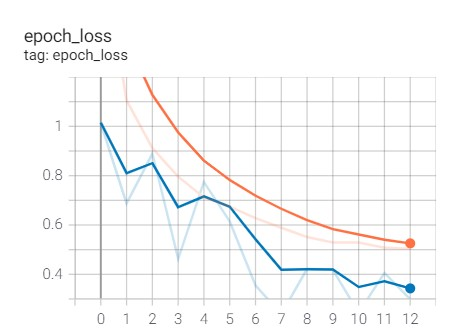

In [ ]:
# model loss
from IPython.display import Image
Image('Tensorboard Plots/BaseModelLoss.jpg')

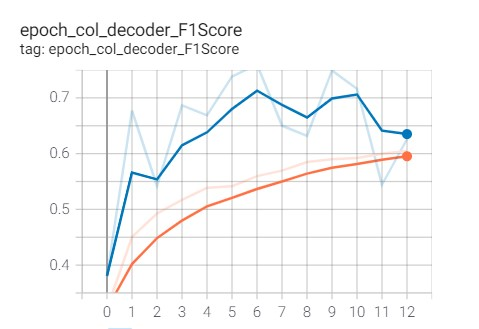

In [ ]:
# col decoder f1 score
Image('Tensorboard Plots/BaseModelColF1.jpg')

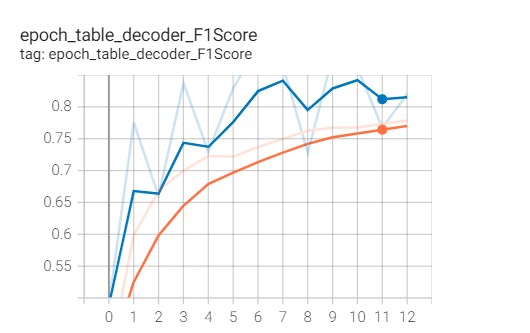

In [ ]:
# table decoder f1 score
Image('Tensorboard Plots/BaseModelTableF1.jpg')

### Making Predictions
For testing the performance of the model on unseen data, lets try and predict the table and column masks for some images and then filter out the table from the image and plot it. We will then also use pytesseract to extract text from the filtered image and print the extracted text.

__Strategy for filtering out the table using masks:__<br>
Refer: https://medium.com/analytics-vidhya/tablenet-deep-learning-model-for-end-to-end-table-detection-and-tabular-data-extraction-from-1961fb2f97e1

Once we get the table and the column masks, we will filter out the table from the image using the table mask. For doing this, we are going to follow the following strategy:


1.   Convert the image and table mask tensors to actual images using PIL.
2.   Convert the table mask to greyscale mode.
3.   Use the converted table mask to change the alpha values of the image in order to filter out the table.



In [ ]:
# remaking the test_dataset with batch_size=1
batch_size=1
test_dataset = config_for_performance(test)

In [ ]:
# helper functions
def get_mask_image(mask_pred):
    '''
        This function gets the predicted mask image from the masks predicted by the model
    '''
    # taking argmax from both the channels
    mask_pred = tf.argmax(mask_pred, axis=-1)
    # adding a channel axis
    mask_pred = mask_pred[..., tf.newaxis][0]
    
    return mask_pred

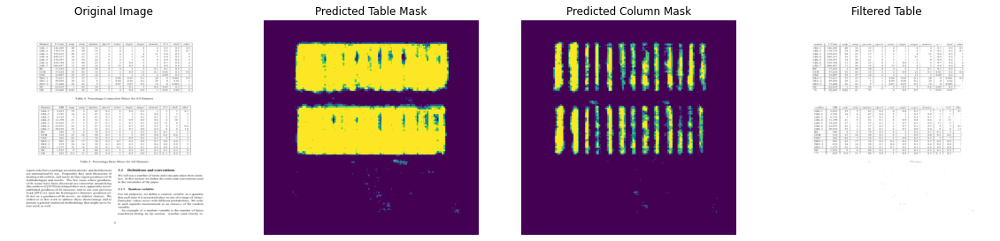

Extracted Text using OCR:
 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

wataaer |W Eann | nip | smap | soraara | sperré | temer { riogin | pnger | aomain 1 a2s _ sneit |’ other
[BL-1 |] 146,209 | 40] 26 16 > 4 T 4 4) 02) 0s] os
tpt-2 || 170.716 |} 34 | 30 16 3 4 : s 402) 02] 07
tes |} 229.835 || 20 | a2 0 3 4 : 4 moa | 03 ‘
tps |} 49357 | 16 |r 1s 3 2 er) sos) o2] 4
tats |] 370307 | 14 | 34 2 5 4 : 6 s| 09 02 :
tats |) s2nzss | 11 | 40 2 “ 3) ox s s|o7| os) 4
LBL-7 606,487 | a 34 1s 4 us 09 4 3 09 O48 6
Be 17,225 z a 30) a a 2 s Or or os z
ucE 37,624 || is | a5 ts 2 2 [09 | 3 0.1 [002 | 02} ow
use 13,097 | _3s-[ 27 i z 3 tp 2 [0.0903 3
Deca |] 72.821 33 | 35 1 T]} oon | aos 0. 30) oP ogor | oe
pec-2 || 491050 || as | 22 s 1 | 00s] 006) 02 29 | 0 | 002 :
pec-3 || 73.440 || 26 | 43 eo! 1) oo7| oo7| 02 19 | 0 | 0.003 :
Ne “ea.nt9 1 | a2 30 = = 03 = ax pons [0s
TR 25,669 | 0.02 a ae 4 oF OF tT 0.02 oor
Salas || EB] sae [Sa

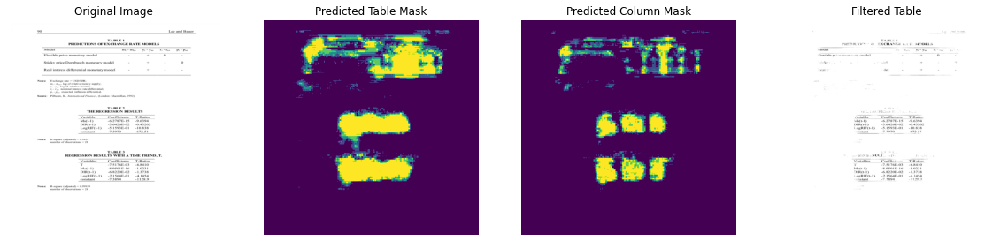

Extracted Text using OCR:
 

lodel

exible price runt une unedet

 

Leah:

  

/ariable

sas(t-1)

DIRC=-1)

LogRIF(t-1)
wonstant

 

Ms(t-1)

DIRG-1
ogRIF(t-1)

nastant

 

Coe!
-7.5176E-03

VABLE, i
CHAN ©

 

 

del -

 

 

Coefficients
-6.2787E-15
-3.6426E-02
-5.1593E-01

 

-8.9501E-16
~6.8220E-02
-2.1564E-01
-7.3894,

  

 

+ a

T-Ratio:

-9.6394
-0.43202
-10.838,

T-Ratios

-6.8410
-1.0231
-1.3738
-4.4454

128 9

----------------------------------------------------------------------------------------------------


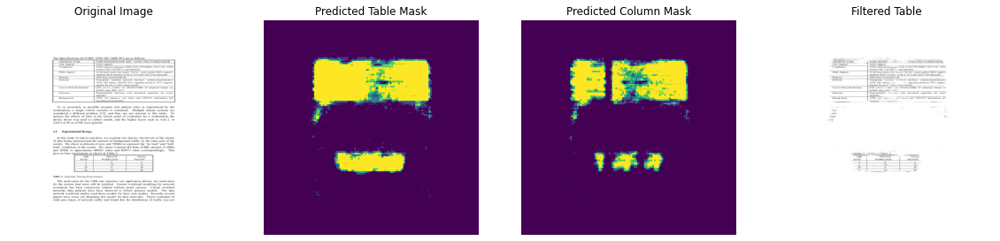

Extracted Text using OCR:
"ARCHITECTURE

 

 

FORE-DESIGN | SAR, [INTEL toe) CO-PROCESSOR,
TAAL Suppo AALS support
‘Compliance ATM cell processing pot ANGE FIST S9DO0IRS, ITU 1361, ATAI

DMA Suppon

 

Forum UNI/3.0/UNI 3.2 specification,
‘32-bit burst mode; bus siaster “fly-by” scatter gather DMA suppor
supports block trois in, of up to 16 words; full 32-bit data path

 

 

Memon

256k bytes on-board KAM

 

‘Software

User to- Network Interface

“Transparent sexmard seoiocol inieWiacey enhanced: peWomnanoe

ATM APL iibrary; £2 /€ signaling protocol PVC suppor
A for up to 1.023 virtual elreuits

UNI 3.03.1; LANT 16, SPANS/FORE IP cahanced Fosture sat

(UNIX only}: REC, £577

 

 

 

Fim ware Programmable iiciware with Gowaload capably Tor easier
rades
Management AIM coll willis CoH enam and VPLVCT taformaton (ail
operating = ae

ste
wlyz.

 

 

iments ai shown au Fabte 3.

 

 

 

 

 

“car Switch TOTAL
RATE WORKLOAD TRAFFIC
2 2° 2
2 70" 7
20 o 20
Th 29. 3.

 

 

-------------

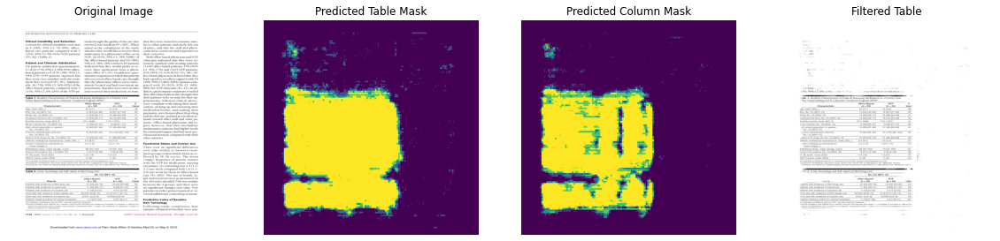

Extracted Text using OCR:
 

an
ST ears
Oe, 859

 

luiphi¥, Baseline Charactenstics of Patents Keceiving Methadone in a Primary Care
fice-Hased Setting and in a Narcotic Treatment Program (NTP)"

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

NTP &
Characteristic ee vate.
mean Shy 758) 8.
ten, No. () (95% CF 14 (64) (45-80) 1667) AFB a2
‘Yona. No. (56) 5% CF 15 (59) (39-77) 23 (96) (80-99) ‘on
imployed iul-ime, No. (=) Boe GD 13 (50) 130-77) 18 (75) 55-88), 40)
fontry rcome. mean SO).S Tt @a9) 7st 1337) 2
aver manied. No. (%) B5% OD 236) (20-57) 9138) B17 22
‘gh school education or greater, 19 (86) [67-85] 21 (68) 169-96) or
No. (3) (95% CF
itvous detoxification atiempt, 1S @H2 CS) Baio BETO OS
No. (%) (5% C9
dion of V drug use, No.(=) BSN OF 12 Ga) iss- 73] ___21 (68) 169-98) o
ume methadone mantonance. mean (SD y 9.4 G4) 50.8) ‘or,
rent methadone maintenance, 3a (to) 46 (114) 24
‘mean (ange). ¥
Acinadone dose. mean Fangs). mg/d (62 20-100) 70 (25-100) a
frown HIV postive, No.(%)

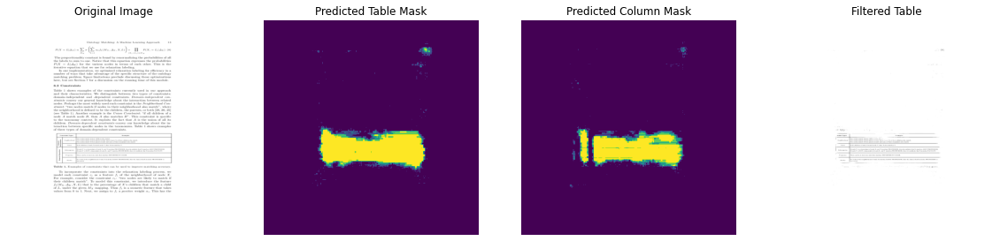

Extracted Text using OCR:
 

 

----------------------------------------------------------------------------------------------------


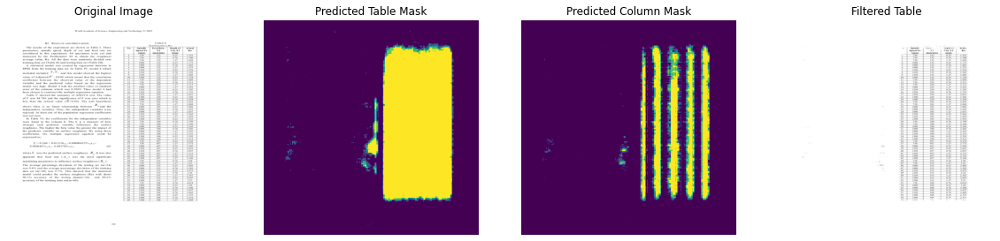

Extracted Text using OCR:
a

ods

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

= | Spina: ‘Ketea
Speed Xt mer Ra
‘epm) | ¢mmimiay

z F50. ts

z 750)

3 750, 152

= 000 Ts

© 100 Ts

7 1350 Ts

= 1330 Ts

o 1250 1s

10) 1s

13 =

rc Bs

1s or)

6 320

1 220

in 229

31 30s 137

3 305 0235

2 305 0:76

2a 305 127

35 30s 035

26 305, 127

ae 380 0.76
380 137
3H0 O25
Ho 0:76
380. 127
3H0 127
a7 O35
as7 137
457 O25
as7 O25
457 0:76
457 127
S15 0-76
sis 137
sis O25
Sis 0.76
Ss O25
S15: 0:76
S15 O35
sis 137
sas 0:76
sa O25
Sai 0.76
Sa 0235

= 2.76

 

 

 

 

 

 

----------------------------------------------------------------------------------------------------


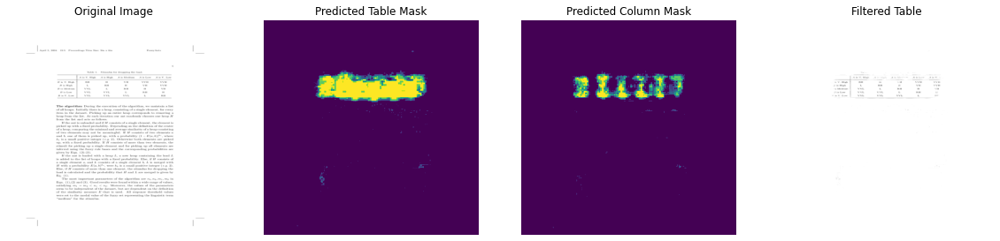

Extracted Text using OCR:
ie Ws Hit

 

 

 

 

----------------------------------------------------------------------------------------------------


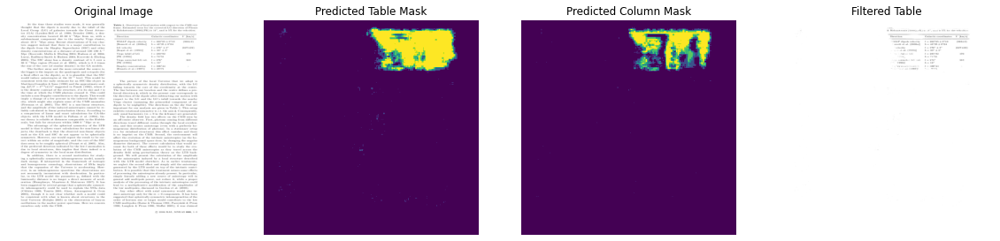

Extracted Text using OCR:
Kolons nonin (ibs).

Direction

“MAP dipole velozity
‘asett ot al. (20088))

sntocity
al, (190))
fables

correctin! EG wel
F995)]
S, 2907))

 

Galactic coordinates

 

1 = 263285 + 0210
b= 48925 + 0°04

t= 276° 43°

ba sor tee

1 = 2x02
»

1

»

1

 

74251
at6°
16"

06844
Meer

 

HE", asta i 55% for the velocities

V [kena]

(3682)
(627422)
170

sia

----------------------------------------------------------------------------------------------------


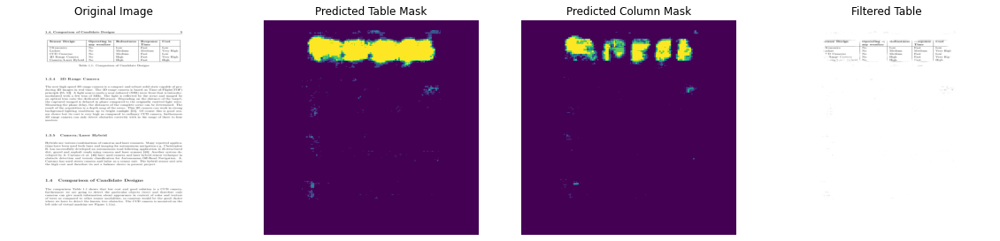

Extracted Text using OCR:
 

 

énsor Design™ wobustness
ftrasonies + No Low
Ladars No Medium
‘CD Camerss No Medium
i Range Camera | No High
era/t Jebsit | No h

 

 

 

 

----------------------------------------------------------------------------------------------------


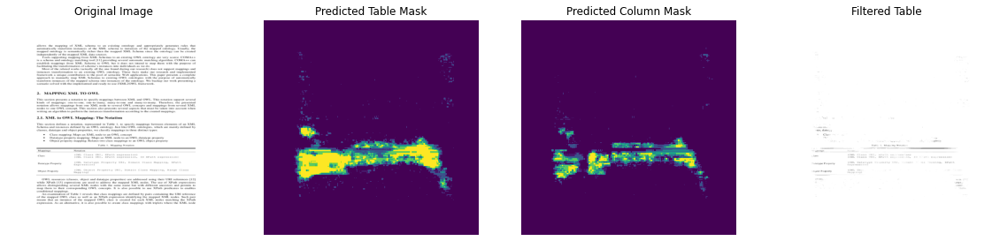

Extracted Text using OCR:
ses, datalyy

Chase

 

seein.

 

tstype Propersy

sajeet Peopeny

 

(own class
(own Class

(ow Datatype

(owe on

 

 

Mapzing Ne:

 

----------------------------------------------------------------------------------------------------


In [ ]:
# making predictions using the new model
# getting 10 images from the test dataset and predicting the masks
for image, masks in test_dataset.take(10):
    # making predictions using the model
    table_mask_pred, col_mask_pred = tablenet.predict(image)
    # getting argmax of both the masks and adding a channel dimension
    table_mask_pred = get_mask_image(table_mask_pred)
    col_mask_pred = get_mask_image(col_mask_pred)
    
    # filtering out the image based on the table mask
    # converting both to images
    im = tf.keras.preprocessing.image.array_to_img(image[0])
    table_mask = tf.keras.preprocessing.image.array_to_img(table_mask_pred)

    # converting the table_mask to greyscale model
    table_mask = table_mask.convert('L')

    # changing alpha of the image based on the table mask
    im.putalpha(table_mask)

    # plotting the image, predicted masks and filtered table
    fig, ax = plt.subplots(ncols=4, figsize=(20,20))
    ax[0].imshow(image[0])
    ax[0].set_title('Original Image')
    ax[1].imshow(table_mask_pred[:,:,0])
    ax[1].set_title('Predicted Table Mask')
    ax[2].imshow(col_mask_pred[:,:,0])
    ax[2].set_title('Predicted Column Mask')
    ax[3].imshow(im)
    ax[3].set_title('Filtered Table')
    # turning axis off for each axis
    ax[0].axis('off')
    ax[1].axis('off')
    ax[2].axis('off')
    ax[3].axis('off')
    plt.show()

    # now, we use pytesseract to extract text from the image
    # refer: https://towardsdatascience.com/how-to-extract-text-from-images-using-tesseract-ocr-engine-and-python-22934125fdd5
    text_data = pytesseract.image_to_string(im, lang='eng')
    print("Extracted Text using OCR:")
    print(text_data)
    print('-'*100)

### Changing the Architecture
Now, let us change the encoder architecture to another pre-trained model and see  if doing that improves the performance of the model.
<br>We will be using the following architectures for the encoders:


1.   ResNet
2.   DenseNet


Both the modles will be pre-trained on __ImageNet__ dataset and will not be trained while training the model just like the original architecture.


### 1. Using ResNet as Encoder
We will use the ResNet-50 architecture for the encoder.

In [ ]:
from tensorflow.keras.applications.resnet import ResNet50

In [ ]:
tf.keras.backend.clear_session()
# encoder
model_input = Input(shape=(1024,1024,3))
encoder = ResNet50(include_top=False, weights='imagenet', input_tensor=model_input)

# setting the weights to untrainable for the encoder
for layer in encoder.layers:
    layer.trainable = False

# getting the outputs for pool3 and pool4
# we are going to choose the following layers for pool3 and pool4 because of the output shapes having the same resolution
# pool3: conv3_block4_out
# pool4: conv4_block6_out
pool3 = encoder.get_layer('conv3_block4_out').output
pool4 = encoder.get_layer('conv4_block6_out').output

# making the convolution layers
conv_6 = Conv2D(filters=512, kernel_size=(1,1), activation='relu', name='block6_conv1',
                kernel_regularizer=regularizers.l2(0.001))(encoder.output)
conv6_drop = Dropout(0.2)(conv_6) # this is the dropping probability and in the paper the keep_prop seems to be 0.8.

conv_7 = Conv2D(filters=256, kernel_size=(1,1), activation='relu', name='block6_conv2',
                kernel_regularizer=regularizers.l2(0.001))(conv6_drop)
conv7_drop = Dropout(0.2)(conv_7) # this is the dropping probability and in the paper the keep_prop seems to be 0.8.

In [ ]:
# decoder
table_mask = table_decoder()
column_mask = col_decoder()

table_out = table_mask(conv7_drop, pool3, pool4)
column_out = column_mask(conv7_drop, pool3, pool4)

# declaring the model
tablenet = Model(inputs=model_input, outputs=[table_out, column_out])
tablenet.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1024, 1024,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 1030, 1030, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 512, 512, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 512, 512, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

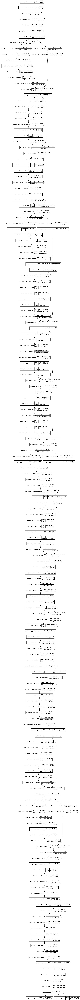

In [ ]:
plot_model(tablenet, show_shapes=True, to_file='ResNet50-TableNet.jpg')

In [ ]:
# compiling the model
from tensorflow.keras.optimizers import Adam
lr = 0.0001 # as defined in the table
tablenet.compile(optimizer=Adam(learning_rate=lr, epsilon=1e-8), loss=losses, metrics=[F1Score()])

In [ ]:
# callbacks
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint

# tensorboard logs
logs = 'ResNet50ModelLogs'
tb = TensorBoard(log_dir=logs, write_graph=True, write_grads=True)

# modelcheckpoint - since there are so many metrics 
filepath = 'ResNet50Checkpoints/model-epoch{epoch:02d}.h5'
mc = ModelCheckpoint(monitor='val_table_decoder_F1Score', filepath=filepath, save_weights_only=True, mode='max', verbose=1, save_best_only=True)

callbacks = [tb, mc]

In [ ]:
# training the model for 20 epochs
train_steps = len(data_train) // batch_size
VALIDATION_STEPS=len(data_test)//batch_size//30
tablenet.fit(train_dataset,
            epochs=20,
            steps_per_epoch=train_steps,
            validation_data=test_dataset,
            validation_steps=VALIDATION_STEPS, 
             callbacks=callbacks)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/20
197/197 [==============================] - 233s 1s/step - loss: 1.8806 - table_decoder_loss: 0.3459 - col_decoder_loss: 0.3016 - table_decoder_F1Score: 0.2394 - col_decoder_F1Score: 0.0441 - val_loss: 1.4502 - val_table_decoder_loss: 0.2647 - val_col_decoder_loss: 0.2480 - val_table_decoder_F1Score: 0.5598 - val_col_decoder_F1Score: 0.1771

Epoch 00001: val_table_decoder_F1Score improved from -inf to 0.55983, saving model to ResNet50Checkpoints/model-epoch01.h5
Epoch 2/20
197/197 [==============================] - 225s 1s/step - loss: 1.3064 - table_decoder_loss: 0.2809 - col_decoder_loss: 0.2471 - table_decoder_F1Score: 0.5078 - col_decoder_F1Score: 0.2230 - val_loss: 1.1262 - val_table_decoder_loss: 0.2405 - val_col_decoder_loss: 0.2287 - val_table_decoder_F1Score: 0.8129 - val_col_decoder_F1Score: 0.3644

Epoch 00002: val_table_decoder_F1Score improved from 0.55983 to 0.81293, saving model to ResNet50Checkpoints/model-epoch02.h5
Epoch 3/20
197/197 [=======================

In [ ]:
# saving the weights
tablenet.save_weights('ResNet_TableNet.h5')

In [ ]:
# loading the weights
tablenet.load_weights('ResNet_TableNet.h5')

#### Making some predictions

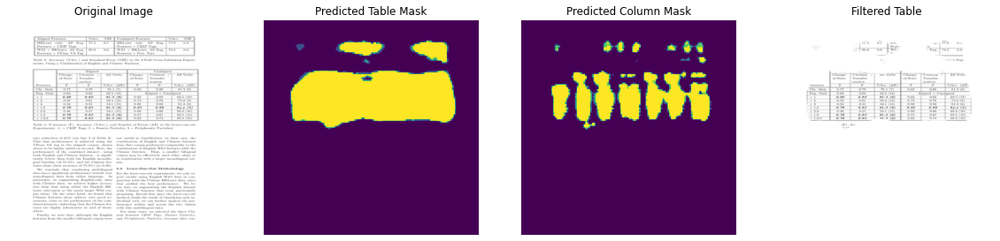

Extracted Text using OCR:
  

 

   

Featy s
80-6 6 wi Eng. | 762 0.6

 

 

 

   

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

Change- Creation / All Verbs Change- All Verb:
of-State | Transfor- of State
ation
F F Acc. (FE) F F WAcc_ GE)
O77 0.79 [78.1 (7) 0.82 0.80 S13 (6)
0.63 0.63 62.5 (12) ‘Aligned = Unaligned
0.80 0.82 81.3 (6) 0.63 0.63 62.5 (12)
0.58 0.61 59.4 (13) 0.73 0.76 75.0 (8)
0.52 0.55, 53.1 (15) 0.80 0.82 S13 (6)
0.79 0.83 81.3 (6) 0.83 0.86 84.4 (5)
048 0.57 53.1 (15) 0.69 68.8 (10)
0.79 0.82 81.3 (6) 0.67 62.5 (12)
0.79 O.83 31.3 (6) 0.62 0.74 68.8 (10)

 

 

 

   

 

 

 

 

(P), Ace

----------------------------------------------------------------------------------------------------


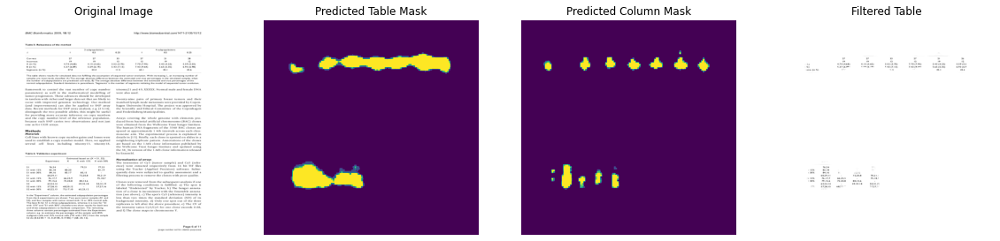

Extracted Text using OCR:
»
ants (10%)

vis.
330%

+ 15%

 

6029.11
76177
7915.6

6224.14

5728.15

7
19
474 (468)
5.37 (6.89

6625.9
7220.8

sent

Ped
19

4.15 (2.62)
5596 19)

7220.8

80.14.
49.33.18

 

7021
75.187

so.3t.ts
s7a7.t

2
3

352370)

5437.13)
is

Pe
a
7:70 (7.95)
7.43 (9.648

2
19
5.43 (4.2)
5.65 (5.35)
45.1

2a
2
559 (56
693168
254

----------------------------------------------------------------------------------------------------


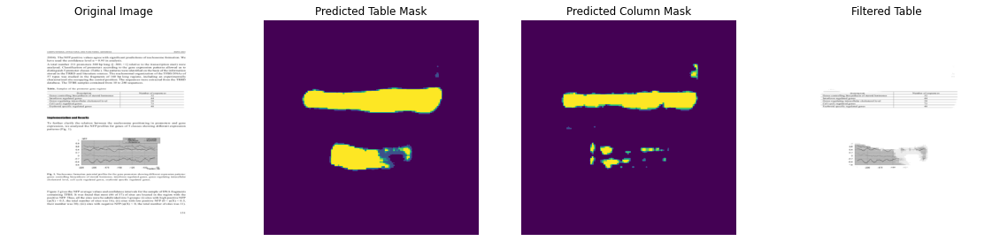

Extracted Text using OCR:
Deseripitn, ‘Number ofsequenses
‘Genes controlling biosynthesis of erold hormones 32
Interferon regulated genes ery
‘Genes regulating intracellular cholesteral level 20-
(Cell eyele regulated genes 3s.
Exythroid specific regulated genes 0.

 

 

 

 

 

 

 

 

 

 

20000:« Ste

----------------------------------------------------------------------------------------------------


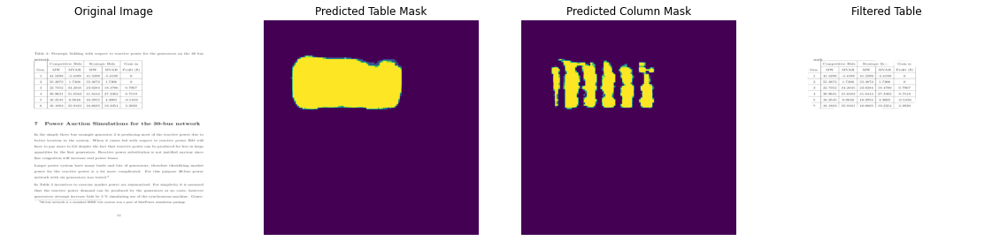

Extracted Text using OCR:
 

Strategic Bi:

 

 

 

 

 

 

 

 

 

 

‘ompetitive Bids Gain in
Gen. | MW MVAR MW_ | MVAR | Profit (8)
1__| 41.5298 | -5.4198 | 41.5298 | -5.4198 o
2 | 55.3872 | 1.7306 | 55.3872 | 1.7306 o
3 | 22.7352 | 34.2045 | 23.0284 | 18.4780 | 0.7967
4 | 39.9631 | 31.6563 | 41.8444 | 27.3382 | 9.7519
5 | 16.2545 | 6.9646 | 16.2955 | 4.3605 | -0.5456
6 35.9161 | 16.6685 3.2930

 

16.1883

 

19.3354

 

 

----------------------------------------------------------------------------------------------------


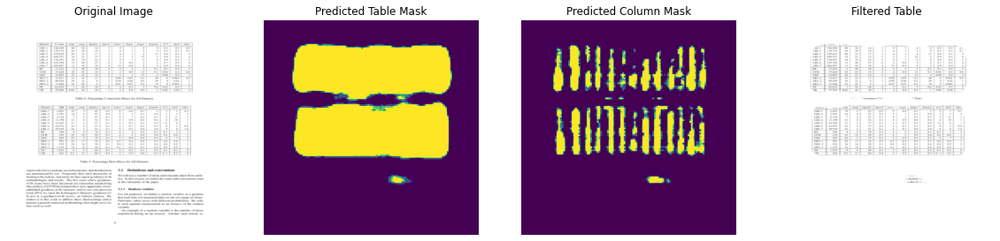

Extracted Text using OCR:
wee:

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

BL-1 || 146.209 | 40] 26 16 3 + T 4 4] 02] 05] o:
ipt-2 || i70718 || 34 | 30 16 3 4 1 s 4} 02] 02] 07
ters || 229.835 || 20 | 33 7 3 4 1 4 1) 04] 03 $
ter || 449.357 |] 16 | 21 1s 3 2 1 32 s| o4| 02 4
tars || 370307 || 14 | 34 2 3 4 1 6 s| o9| 02 5
ter || 528784 |] 11 | 40 3 6 3] os 3 s| o7| o4 4
ter-7 || 606487 || | 34 1s 4) us] oo 4 s|oo| o4 6
Be 17.235 2 [49 30) a = 2 3 Or] or] os 2
eB 37,624 |[ ix | 45 ts 2 2] 09 iz o1 | 0.02 | 02 | ox
Use 13.097 _|[_35_[ 37 1 2 3 7 0 2 [0.09 | 03 3
DECT || 72.821 | 33) 35 i T) aos | 00s | 0. zo Oo) Ooor | os
pec-2 || 49050 || 38 | 22 8 1} 004] 006 | 02 29) 0 | 0.02 1
pecs || 73.440 || 26 | 43 9 1 | 007 | 007 | 02 19 | 0 | 0.003 1
NE 62,519 142 30) - sp 0s 3 ox] 003 | 03 3
UK 23.669 || 0.02 | 42 39 7 a] 04) 09 10.02 | _0.02 7
>ercentase Cor 8 Data

wai jj meee Snap _Lsmip | fipdata | fipcird | wees "vo

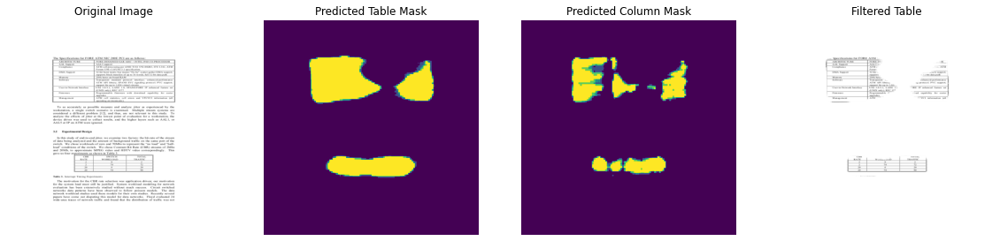

Extracted Text using OCR:
__ Specifications for FORE ATM.

 

 

 

 

 

 

 

 

 

 

ARCHITECTURE FORE z
[AL Suppo AALS
‘Compliance ‘ATM ¢ Are
Forut
DMA Suppow 32-bit! oni Rsappom
| suppor: Eyicaata pa
Manoa 250K byte
‘Software Transparent Jnhanced:peiformance
ATM APE library: 12 protocol PVC suppor
for up 10 1,02:
Userto- Network Taterface | UNI 3.0/3.1; LANE Ti SRE TP calanced feature st
(UNIX only}, RFC 157
Fienware Programmable iad apability tor easier

 

 

 

rade
—Maragement TVET information Git

cur PorAL

 

 

 

 

 

 

 

----------------------------------------------------------------------------------------------------


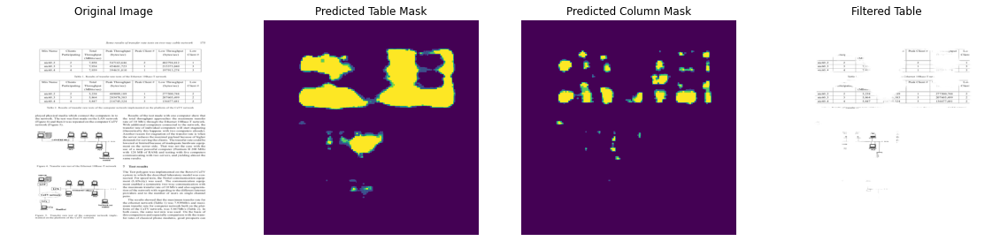

Extracted Text using OCR:
 

 

 

 

 

 

 

 

 

shput |

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

Peak Client # Lo
sticty Client
Mt:
nic60_2 2 2
nic60_3 3 ne 1
nic 60.4 4 7.94 1 W 3
Table
~ Lo
asticipatin, Client
(MBit
nic60_2 2 5.238 289 1 277500,748 2
nic6O_3 3 5.864 A383 3 207605499 2
nic60_4 4 5.847 216015 324 3 136677,681 2
i ei
at r un
«

----------------------------------------------------------------------------------------------------


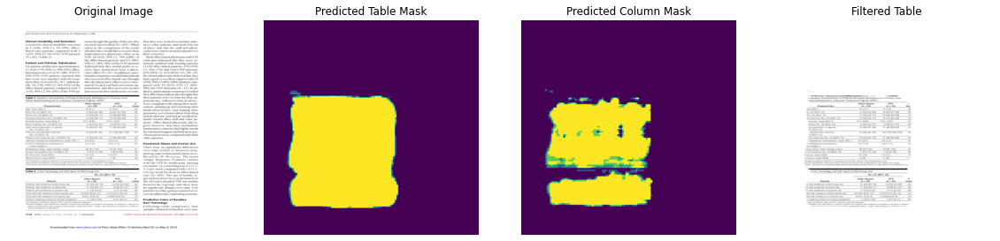

Extracted Text using OCR:
{Baseline Charactenstics of Patents Receiving Methadone in a Primary Care
Sased Setting and in a Narcotic Treatment Program (NTP)"

 

 

 

 

 

 

 

 

 

Office-Based NTP ®
Characteristic (e= 23) (= 24) vase
san Shy 2E7 58) ss,
Jo. 06) (05% OF 14 (64) (45-80) 1667) AFB 22.
No. (%) 5% Of 15 (59) (39-77) 23 (96) (80-99) ‘or
Jod tabtime, No. (=) BS™ OF 13 (50) 130-77) 18 (75) 55-88), 40)
income, mean SO}. Tt @a9) 7st 1337) 2
‘amied. No. (6)(BS% Cy 236) (20-57) 9138) B17 22,
teal education or greater, 19 (86) [67-85] 21 (68) 169-96) ot
Siwss on
detonification attempt, Te SH lees] 2a TOG) BE TOG OS
ose OF
SV drag uae. No.() BER OD 12 Ga) iss- 73] ___21 (68) 169-98) 23
methadone mantenance, mean (GO. y 9.48.4) 50.8) 7
iimethadone maintenance, 3a (to) 46 (114) 24
an (range). ¥
[done dose. mean Fangs). mg/d (62 20-100) 70 (25-100) a
HIV postive, No.(%) BEX OF ‘G27 (13-48) 2 (6) B26) 28
5 score. mean SOT Ts 03) 1s en) 75
‘D score. mean (SOV = O é

   

‘na for the

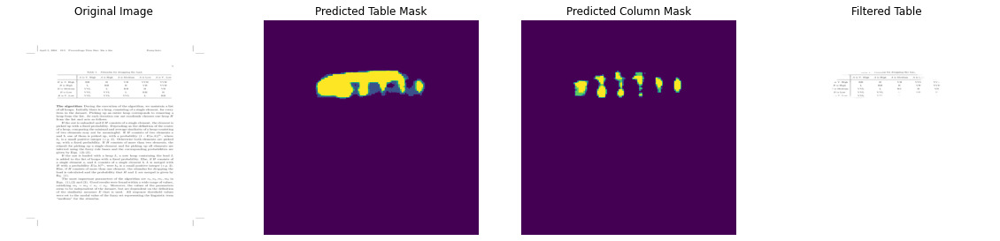

Extracted Text using OCR:
Toe.
A he

va

Stiealus for dropping the

A le Medium

A tm High

      

Ais V. High,

   

ia V. High
Bis High
Bin Low bern

 

----------------------------------------------------------------------------------------------------


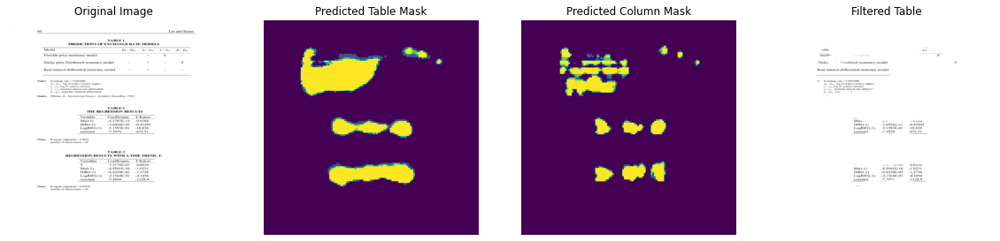

Extracted Text using OCR:
adel Yon

 

 

lexibt
Sticky embusch monetary model

Real interest differential monetary model

Exchange rate = USD/IDR:
i ~ Mun, low Of relative money supply:
2s Yun Log Of relative income:

byron nominal interest rate differe”
Pom Pare €XPH °

 

 

 

DIRG-15 -3.6426E-U2 0.43202
LogRIF(t-!) —-5.1593E-O1 — -10.838
constant -7.3970 672.51
Ldh EOS 6.8410
Ms(t-i) -8.9501E-16  -1.0231
DIRG-1) -6.8220E-02  -1.3738

LogRIF(t-1)  -2.1564E-01  -4.1454
constant 7.3204 -1128.9

 

 

----------------------------------------------------------------------------------------------------


In [ ]:
# getting 10 images from the test dataset and predicting the masks
for image, masks in test_dataset.take(10):
    # making predictions using the model
    table_mask_pred, col_mask_pred = tablenet.predict(image)
    # getting argmax of both the masks and adding a channel dimension
    table_mask_pred = get_mask_image(table_mask_pred)
    col_mask_pred = get_mask_image(col_mask_pred)
    
    # filtering out the image based on the table mask
    # converting both to images
    im = tf.keras.preprocessing.image.array_to_img(image[0])
    table_mask = tf.keras.preprocessing.image.array_to_img(table_mask_pred)

    # converting the table_mask to greyscale model
    table_mask = table_mask.convert('L')

    # changing alpha of the image based on the table mask
    im.putalpha(table_mask)

    # plotting the image, predicted masks and filtered table
    fig, ax = plt.subplots(ncols=4, figsize=(20,20))
    ax[0].imshow(image[0])
    ax[0].set_title('Original Image')
    ax[1].imshow(table_mask_pred[:,:,0])
    ax[1].set_title('Predicted Table Mask')
    ax[2].imshow(col_mask_pred[:,:,0])
    ax[2].set_title('Predicted Column Mask')
    ax[3].imshow(im)
    ax[3].set_title('Filtered Table')
    # turning axis off for each axis
    ax[0].axis('off')
    ax[1].axis('off')
    ax[2].axis('off')
    ax[3].axis('off')
    plt.show()

    # now, we use pytesseract to extract text from the image
    # refer: https://towardsdatascience.com/how-to-extract-text-from-images-using-tesseract-ocr-engine-and-python-22934125fdd5
    text_data = pytesseract.image_to_string(im, lang='eng')
    print("Extracted Text using OCR:")
    print(text_data)
    print('-'*100)
    # break

#### 2. Using DenseNet as encoder.
We are going to use the DenseNet121 archtecture for the encoder.

In [ ]:
from tensorflow.keras.applications.densenet import DenseNet121

In [ ]:
# making the encoder architecture
tf.keras.backend.clear_session()
model_input = Input(shape=(1024,1024,3))
encoder = DenseNet121(include_top=False, weights='imagenet', input_tensor=model_input)

# for pool3 and pool4, we are going to use the outputs of the following layers
# pool4 = pool4_relu
# pool3 = pool3_relu
pool3 = encoder.get_layer('pool3_relu').output
pool4 = encoder.get_layer('pool4_relu').output

# making all the layers of the encoder untrainable
for layer in encoder.layers:
    layer.trainable = False

# continuing the model architecture
# convolution layers
conv_6 = Conv2D(filters=512, kernel_size=(1,1), activation='relu', name='block6_conv1',
                kernel_regularizer=regularizers.l2(0.001))(encoder.output)
conv6_drop = Dropout(0.2)(conv_6) # this is the dropping probability and in the paper the keep_prop seems to be 0.8.

conv_7 = Conv2D(filters=256, kernel_size=(1,1), activation='relu', name='block6_conv2',
                kernel_regularizer=regularizers.l2(0.001))(conv6_drop)
conv7_drop = Dropout(0.2)(conv_7) # this is the dropping probability and in the paper the keep_prop seems to be 0.8.

In [ ]:
# decoders
table_mask = table_decoder()
column_mask = col_decoder()

table_out = table_mask(conv7_drop, pool3, pool4)
column_out = column_mask(conv7_drop, pool3, pool4)

# declaring the model
tablenet = Model(inputs=model_input, outputs=[table_out, column_out])
tablenet.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1024, 1024,  0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 1030, 1030, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 512, 512, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 512, 512, 64) 256         conv1/conv[0][0]                 
______________________________________________________________________________________________

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.685918 to fit



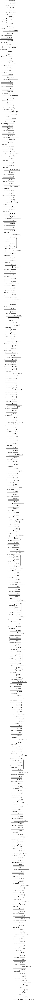

In [ ]:
plot_model(tablenet, show_shapes=True, to_file='DenseNetModel.jpg')

In [ ]:
# compiling the model
from tensorflow.keras.optimizers import Adam
lr = 0.0001 # as defined in the table
tablenet.compile(optimizer=Adam(learning_rate=lr, epsilon=1e-8), loss=losses, metrics=[F1Score()])

In [ ]:
# callbacks
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint

# tensorboard logs
logs = 'DesneNet121ModelLogs'
tb = TensorBoard(log_dir=logs, write_graph=True, write_grads=True)

# modelcheckpoint - since there are so many metrics 
filepath = 'DenseNet121Checkpoints/model-epoch{epoch:02d}.h5'
mc = ModelCheckpoint(monitor='val_table_decoder_F1Score', filepath=filepath, save_weights_only=True, mode='max', verbose=1, save_best_only=True)

callbacks = [tb, mc]

In [ ]:
# training the model for 20 epochs
train_steps = len(data_train) // batch_size
VALIDATION_STEPS=len(data_test)//batch_size//30
tablenet.fit(train_dataset,
            epochs=20,
            steps_per_epoch=train_steps,
            validation_data=test_dataset,
            validation_steps=VALIDATION_STEPS, 
             callbacks=callbacks)

Epoch 1/20
395/395 [==============================] - 413s 1s/step - loss: 1.5275 - table_decoder_loss: 0.2294 - col_decoder_loss: 0.2402 - table_decoder_F1Score: 0.6567 - col_decoder_F1Score: 0.3580 - val_loss: 0.9972 - val_table_decoder_loss: 0.0888 - val_col_decoder_loss: 0.1249 - val_table_decoder_F1Score: 0.9129 - val_col_decoder_F1Score: 0.7680

Epoch 00001: val_table_decoder_F1Score improved from -inf to 0.91293, saving model to DenseNet121Checkpoints/model-epoch01.h5
Epoch 2/20
395/395 [==============================] - 353s 894ms/step - loss: 0.9642 - table_decoder_loss: 0.1445 - col_decoder_loss: 0.1647 - table_decoder_F1Score: 0.8124 - col_decoder_F1Score: 0.6144 - val_loss: 0.7968 - val_table_decoder_loss: 0.1167 - val_col_decoder_loss: 0.1216 - val_table_decoder_F1Score: 0.8703 - val_col_decoder_F1Score: 0.7780

Epoch 00002: val_table_decoder_F1Score did not improve from 0.91293
Epoch 3/20
395/395 [==============================] - 353s 894ms/step - loss: 0.7777 - table_de

In [ ]:
# saving the weights
tablenet.save_weights('DenseNet-Tablenet.h5')

### Making Predictions

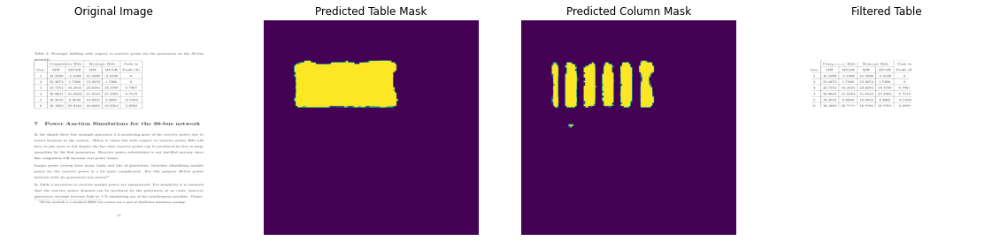

Extracted Text using OCR:
 

 

 

 

 

 

 

 

 

 

lompessve Bids | Strasexie Bids Gain in
Gen. | MW MVAR MW_ | MVAR | Profit ($
1__| 41.5298 | -5.4198 | 41.5298 | -5.4198 o
2 | 55.3872 | 1.7306 | 55.3872 | 1.7306 o
3 | 22.7352 | 34.2045 | 23.0284 | 18.4780 | 0.796%
4 | 39.9631 | 31.6563 | 41.8444 9.7519
5 | 16.2545 | 6.9646 | 16.2955 | 4.3605 | -0.5456
6 | 16.1883 | 350161 | 166685 | 192354) 3.2080

 

 

 

 

 

----------------------------------------------------------------------------------------------------


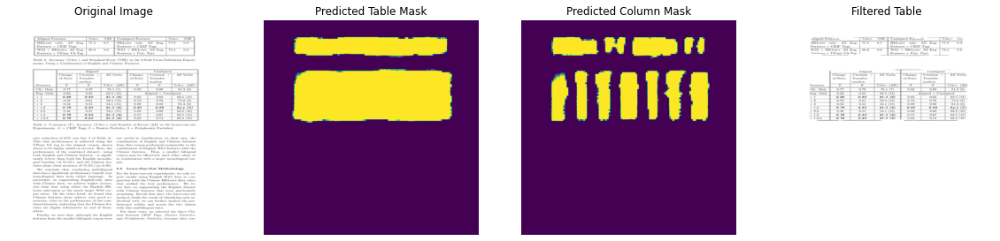

Extracted Text using OCR:
Aligned Features %Ace_ SE J] Unaligned Feauwses Wrce. _%S.

 

 

 

AIKLaws only, AN Eng. | 77.5 07 || HKLaws only, Al Eng. | 77.9 0.8
Features + CKIP Tags Features + CKIP Tags
WSJ + HKLaws, All Eng | 806 06 WSJ + HKLaws, Al Eng. | 762 0.6
eatmres + UPenn VA-Tac Features + Peri. Part.

  

 

 

 

   

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

Angnea Unaligned
Change- | Creation 7] All Verbs [Change All Verbs
of-State | Transfor- of State
ation
Features F F Acc. (FE) F F Ace GFE.
Chi. Only 0.77 079° [78.1 (7) 0.82 0.80 S13 (6)
Sng. Only 0.63 0-63 62.5 (12) ‘Aligned — Unaligned
ea 0.80 0.82 81.3 (6) 0.63 0.68 62.5 2)
42 0.58 0.61 59.4 (13) 0.73 0.76 75.0 (8)
+3 0.52 0.55 53.1 (15) 0.80 0.82 81.3 (6)
+12 0.79 0.83 81.3 (6) 0.83 0.86 84-4 (5)
0.48 0.57 53.1 (15) 0.69 65.8 (10)
+13 0.79 0.83 81.3 (6) 0.67 62.5 (12)
+128 0.79 O.8F 81.3 (6) 0.62 0.74 68.8 (101

 

 

 

 

 

 

 

 

 

----------------------------------------------------------------------

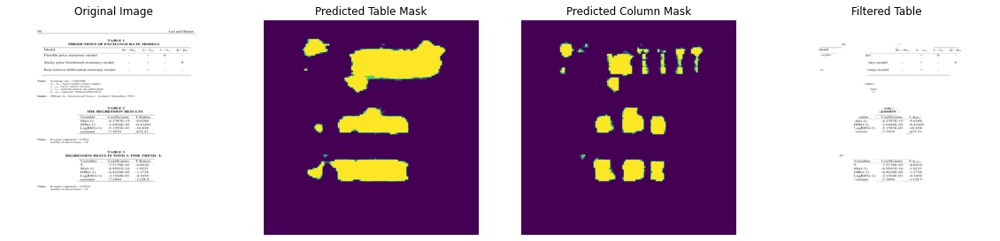

Extracted Text using OCR:
 

ae

m-ms Yi Yu

 

del
“tary model
tetary model
ysupplys
intial:
‘al
AL
2©SSION
riable ients
Mis(t-1), -6.2787E-15
DIR(-1) -3.6426B-02
LogRIF(t1) — -5.1593E-01
onstan -7.3970
Variables Coefficients
T -7.5176E-03
Ms(t-1) -8.9501E-16
DIRG-1) -6.8220B-02
LogRIF(t-1) — -2.1564E-01
constant

T-Rain
9.6394
0.43202
-10.838

_-672.51

 

__-7.3894

  

----------------------------------------------------------------------------------------------------


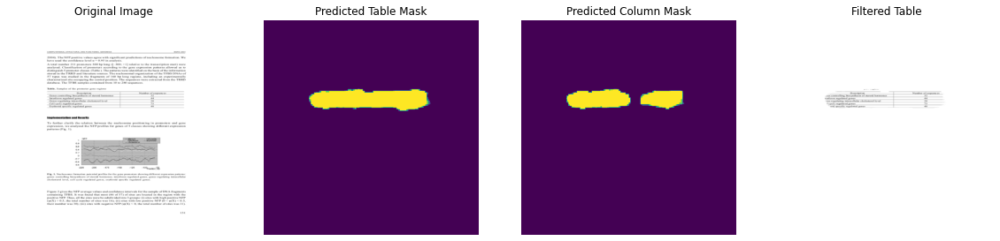

Extracted Text using OCR:
 

 

Description:

 

 

 

 

‘Number ofsequenses
digs controlling biosynthesis of wereld hormones 32
ferferon regulated genes ery
Shes regulating intracellular cholesterol level 20-
Teyele regulated genes 3s.
roid specific regulated genes

 

 

0.

----------------------------------------------------------------------------------------------------


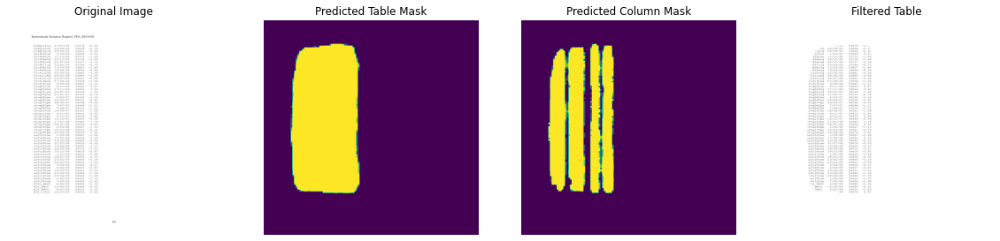

Extracted Text using OCR:
sIp7q
1220em
t040em
405mhq,
[a06euq
L40712q
isosceq
i409a3q
14410a2q
H4liubq
vial 23 eq
9441 3bwq
9i4140em
9vg0ldcm
9vg02d0q
9vg03usq
9vg0360q
9vg04 0mm
9vg060hm
18vg070pm
19vg080pm
19090 km
19vg100em
\Svgll0om
\9vg120pm
19vgl30pm
:9vgl40pm
19vg150pm
igvglédpm
u9vgi70pm
u9vglsdpm
ua5t0idom
uaSt0200m
uast030nm
1a5t0400m
1a5t0500m
laSt16dom
laSt180nm
laSt2700m
laSt190nm
laSt200nm
laSt210mn
laSt2200m
la5t2800m
a5t2900m
a5t3000m
35t3100m
15t3200m
i5£3300m
15_SMOv
+_BMov
SMO"

 

 

26/08/05
08/09/05
1/10/05
21/12/05
30/12/05
22/01/06
23/02/06
13/03/06
19/04/06
25/05/06
03/06/06
05/07/06
07/08/06
9709/06
6/11/06
27/11/06
20/01/07
21/01/07
6/03/07
25/04/07
28/05/07
3707/07
3708/07
18/09/07
6/11/07
2/12/07
15/12/07
17/01/08
28/01/08
2/03/08
16/03/08
20/04/08
1/05/08
13/06/08
23/06/08
31/07/08
15/08/08
24/03/08
19/12/08
1/01/03
28/01/09
23/02/03
22/03/09
3704709
6/04/03
10/04/09
23/04/03
25/04/09
1/05/03
3705/03
4/06/09
14/06/09
9/07/03
fone

53578
53608
$3622
53644
5

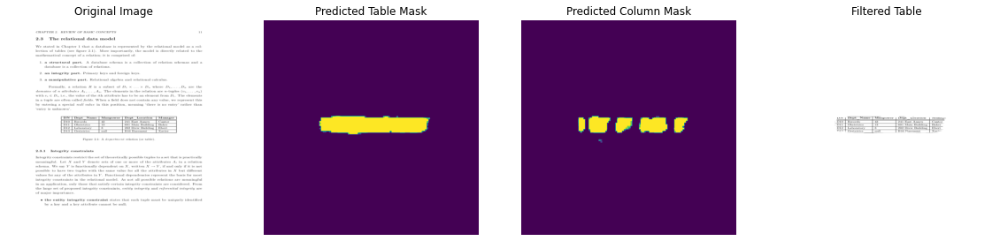

Extracted Text using OCR:
wy | Dept_Name | Manpower | Sept_vocauon

  

 

   

 

  
  
 

  
 
 

   
   

Dio | Records Dil Bast Annex
Dil | Obstetrics 601 Mam Building
Diz | Laboratory 202 Drew Buildin

 

‘Geriatrics BIG Prasement

----------------------------------------------------------------------------------------------------


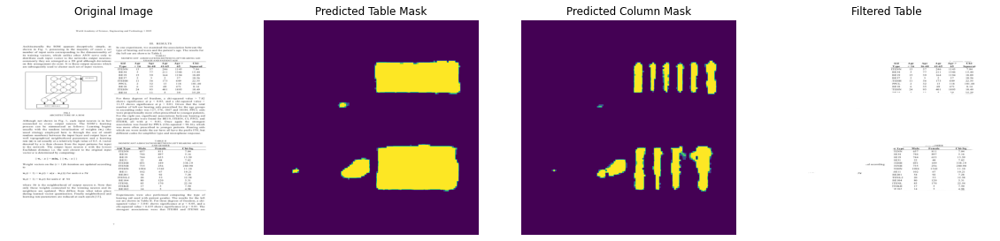

Extracted Text using OCR:
sad according,

 

 

Aid Age Age Age Age> che
Type =16 16-40 4 6s Squared
73 ‘ST 246 7.84
s 77 211 1346 15.44
BEIS 15 39 1641194 18.09
BE37 2 3 2 27 10.56
TEHH n 36 173 649, 22.55
PPCL 2 32 3 ris 101.40
BEIS 6 35 69 471 8.14
TEHN 24 9s 401 195, 10.49
nena . = = he 35.29

TENN, 657
3E34 746
3E19 74.
3ES1 22
TEHH 691
FENH 735
TEHN 1094
3EIL 102

BE201 34

TENL2 20

BE104 50

iTENL. 85

TEKH 7

HE102 4

 

 

 

----------------------------------------------------------------------------------------------------


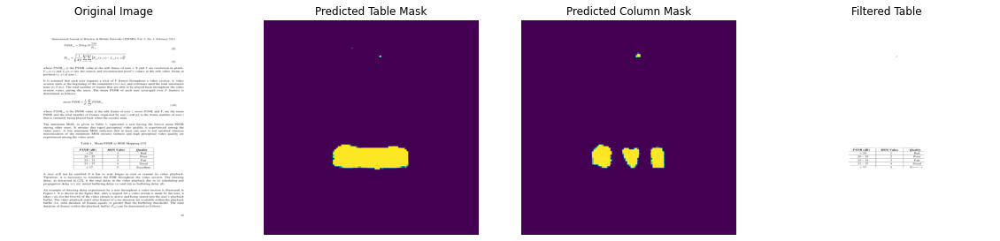

Extracted Text using OCR:
 

 

 

 

 

 

PSNR (dB) MOS Value Quality
<20 1 Bad
20-25 2 Poor
25— 31 3 Fair
a Good

5

 

 

 

Fxcoton

----------------------------------------------------------------------------------------------------


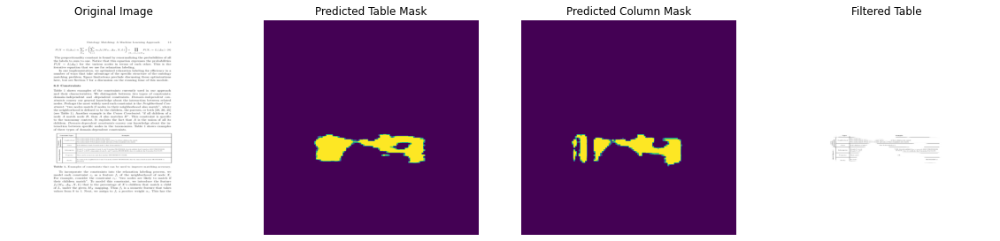

Extracted Text using OCR:
 

 

 

 

 

 

----------------------------------------------------------------------------------------------------


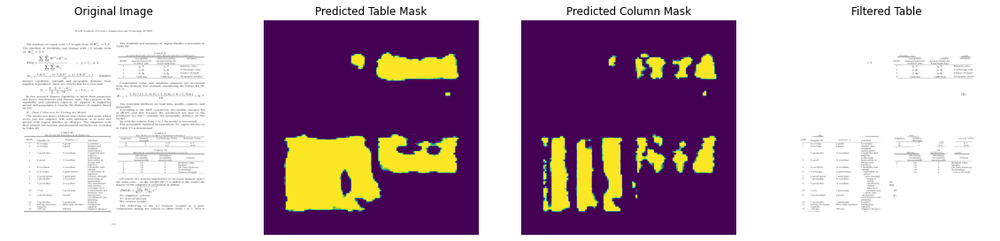

Extracted Text using OCR:
 

 

Zroness)

 

 

 

 

 

 

 

 

 

 

 

 

“AScopuble sepa
ROW — measurements for measurements for
oT ‘Exhaust part Pucl tank Part
T =7 =7 Relation vals
2 26 26 ‘Technology valu
3 26 26 Finance strength
4 <100 Km <400 Km ___ Geography distane
ay
rw —-
HOW supplier B Supper a Anribute
1 —Taverge S good Lead time rs 7
{0 Gavemge 6 good Quality and oo Aes,
Standard
maintenance vt
| 7 g00d plus # excellent Capability and Marvin. nuorce, sives
supplice ‘Maxima
technology Accopmble Criteria
4 6 g008 excellent innovation moamareutM) moasurestS)
design and To 7 ‘Relation value
logistics 10 ? Quality
5 #excellemt excellent Flexmitty and 10 6 On Time Delivery
Shane 10 6 ‘Technoloxy
6 4 Average 5 good minus Sooperation 10 6 nance strona
‘istics
7S good minus 7 good plus Syace strength
ST good plus excellent ssting
crship un
9 79008 ple 8 excellent ‘sformation
lation dex
inge level
10 alow 7 good plus ‘mitment and Lb
1 5 good minus 6 good perational x
coordinatio

In [ ]:
# making pedictions
# getting 10 images from the test dataset and predicting the masks
for image, masks in test_dataset.take(10):
    # making predictions using the model
    table_mask_pred, col_mask_pred = tablenet.predict(image)
    # getting argmax of both the masks and adding a channel dimension
    table_mask_pred = get_mask_image(table_mask_pred)
    col_mask_pred = get_mask_image(col_mask_pred)
    
    # filtering out the image based on the table mask
    # converting both to images
    im = tf.keras.preprocessing.image.array_to_img(image[0])
    table_mask = tf.keras.preprocessing.image.array_to_img(table_mask_pred)

    # converting the table_mask to greyscale model
    table_mask = table_mask.convert('L')

    # changing alpha of the image based on the table mask
    im.putalpha(table_mask)

    # plotting the image, predicted masks and filtered table
    fig, ax = plt.subplots(ncols=4, figsize=(20,20))
    ax[0].imshow(image[0])
    ax[0].set_title('Original Image')
    ax[1].imshow(table_mask_pred[:,:,0])
    ax[1].set_title('Predicted Table Mask')
    ax[2].imshow(col_mask_pred[:,:,0])
    ax[2].set_title('Predicted Column Mask')
    ax[3].imshow(im)
    ax[3].set_title('Filtered Table')
    # turning axis off for each axis
    ax[0].axis('off')
    ax[1].axis('off')
    ax[2].axis('off')
    ax[3].axis('off')
    plt.show()

    # now, we use pytesseract to extract text from the image
    # refer: https://towardsdatascience.com/how-to-extract-text-from-images-using-tesseract-ocr-engine-and-python-22934125fdd5
    text_data = pytesseract.image_to_string(im, lang='eng')
    print("Extracted Text using OCR:")
    print(text_data)
    print('-'*100)
    # break

## Observations after training all the three models



*   Out of the three encoder models, that are, i. VGG-19, ii. ResNet50 and iii. DenseNet121, using DenseNet121 seems to give the best results followed by the VGG-19 and ResNet50 has the worse performance among all three after being trained for 20 epochs.
*   In the training logs, it can be seen that the validation loss seems to fluctuate quite a bit. This might be because we are not using the complete validation data for calculating validation metrics during each epoch but only a part of it. However, we can see in the tests that the model has not overfit because it gives good results in the test data as well.

__While testing the model performance on the test data, we can observe the following things:__
*   The model performs the best whenever the table is well defined. i.e. it has well defined separation lines, does not have lots of white spaces etc.
*   Whenever two tables are very close to each other, specially if they are very close to each other vertically, the model tends to confuse them as one single table and hence the column identification for such images suffer as seen in some of the images.
*    One way to cure this behaviour of the model is to increase the amount of training data in the model since we only have about 494 images in which we have to perform train-test split as well which decreases the amount of data avaialable for training even more.



